In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.neighbors import NearestNeighbors

In [37]:
def kth_neighbour(k, metric='euclidean'):
    neigh = NearestNeighbors(n_neighbors=k, metric=metric)
    neigh.fit(X)
    dist, ind = neigh.kneighbors(X)
    distances = [dist[i][k - 1] for i in range(len(dist))]
    sorted_dist = sorted(distances)
    return sorted_dist

def plot_kdist(dist, idx):
    plt.figure(figsize =(10, 7))
    plt.plot(dist)
    plt.axvline(x=idx, color='r', linestyle='dashed')
    plt.axhline(y=dist[idx], color='r', linestyle='dashed')
    plt.ylabel("k-distances (eps)")
    plt.grid(True)
    plt.show()
    
def find_eps(dist):
    sec_drv = np.diff(dist, 2)
    start, end = 100, -300
    idx = np.argmax(sec_drv[start:end]) + start
    eps = dist[idx]
    print('start = {}, end = {}'.format(start, end))
    print('eps_idx = {}, eps = {}'.format(idx, eps))
    return idx, eps

def try_dbscan(samples, eps, min_pts, metric='euclidean'):
    # Based on graph above, use eps = 0.9
    db = DBSCAN(eps=eps, min_samples=min_pts, metric=metric).fit(samples)
    
    core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    db_labels = db.labels_

    n_clusters_ = len(set(db_labels)) - (1 if -1 in db_labels else 0)
    n_noise_ = list(db_labels).count(-1)
    print('Estimated number of clusters: %d' % n_clusters_)
    print('Estimated number of noise points: %d' % n_noise_)
    print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(X, db_labels))
    
    # Black removed and is used for noise instead.
    plt.figure(figsize =(9, 9)) 
    unique_labels = set(db_labels)
    colors = [plt.cm.Spectral(each)
              for each in np.linspace(0, 1, len(unique_labels))]

    for k, col in zip(unique_labels, colors):
        if k == -1:
            # Black used for noise.
            col = [0, 0, 0, 1]

        class_member_mask = (db_labels == k)

        xy = X[class_member_mask & core_samples_mask]
        plt.plot(xy.iloc[:, 0], xy.iloc[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=14)

        xy = X[class_member_mask & ~core_samples_mask]
        plt.plot(xy.iloc[:, 0], xy.iloc[:, 1], 'o', markerfacecolor=tuple(col),markeredgecolor='k', markersize=6)

    plt.title('Estimated number of clusters: %d' % n_clusters_)
    plt.show()
    title = 'DBScan_{}_{}'.format(str(min_pts), str(eps))
    labels_in_cluster(db.labels_, n_clusters_, title)
    return db.labels_, n_clusters_

    
def labels_in_cluster(given_cluster, num_clusters, title=None):
    y_train_vals = y.values
    classes_in_cluster = np.zeros(shape=(num_clusters, len(labels)), dtype=int)
    for i in range(num_clusters):
        dataInd = np.argwhere(given_cluster==i).flatten()
        for ind in dataInd:
            if ',' in y_train_vals[ind]:
                split = y_train_vals[ind].split(', ')
                for s in split:
                    j = np.where(labels == s)
                    classes_in_cluster[i][j] += 1
            else:
                j = np.where(labels == y_train_vals[ind])
                classes_in_cluster[i][j] += 1
    
    plt.figure(figsize=(15,5))
    if title:
        plt.title("Labels within clusters by {}".format(title))
    else:
        plt.title("Labels within clusters")
    sns.heatmap(classes_in_cluster, annot=True, cmap='Blues', fmt="d")
    plt.xticks([(i+0.5) for i in np.arange(len(labels))], labels=labels)
    plt.show()

In [10]:
# Read all_data
# NN Embeddings: 
# 1. DNN_player_embeddings_v2.csv
# 2. DNN_player_embeddings_(5,36,32).csv
# LDA Embeddings: 
# 1. soccer_player_embeddings_feature_no_labels_LDA.csv
# PCA Embeddings: 
# 1. soccer_player_embeddings_feature_labels.csv
# 2. soccer_player_embeddings_feature_no_labels.csv

filenames = ['DNN_player_embeddings_v2.csv',
             'DNN_player_embeddings_(5,36,32).csv',
             'soccer_player_embeddings_feature_no_labels_LDA.csv',
             'soccer_player_embeddings_feature_labels.csv',
             'soccer_player_embeddings_feature_no_labels.csv']

all_dfs = []
for file in filenames:
    df = pd.read_csv('../../datasets/final_embeddings/{}'.format(file))
    all_dfs.append(df)

# DBScan Clustering for PCA embedding

In [16]:
# PCA: with labels
df = all_dfs[3]
df.head(2)

,Unnamed: 0,player_positions,player_fifa_api_id,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,player_positions_general
0,0,CB,218353,0.232763,-0.672787,-0.228158,-0.305577,-0.407377,0.189798,0.084585,-0.138398,-0.113971,0.152152,DEF
1,1,LB,189615,-1.099358,0.106072,1.203658,0.733224,-0.393621,-0.237771,0.361361,0.183376,0.022748,-0.037838,DEF


In [20]:
y = df['player_positions']
X = df.drop(columns=['Unnamed: 0', 'player_positions', 'player_fifa_api_id','player_positions_general'])

labels = []
for l in y.values:
    if ',' in l:
        labels.extend(l.split(", "))
    else:
        labels.append(l)

labels, counts = np.unique(labels, return_counts=True)

n_features = len(X.columns)
MIN_PTS = [i for i in range((n_features*2)-5, (n_features*2)+6)]

Using minpts - 23
start = 100, end = -300
eps_idx = 6014, eps = 0.7847749016458325


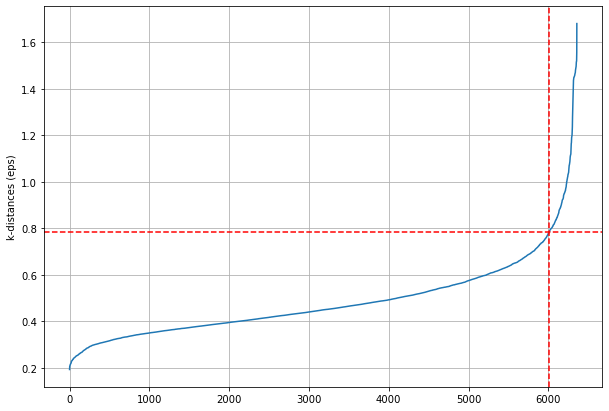

Estimated number of clusters: 16
Estimated number of noise points: 108
Silhouette Coefficient: 0.392


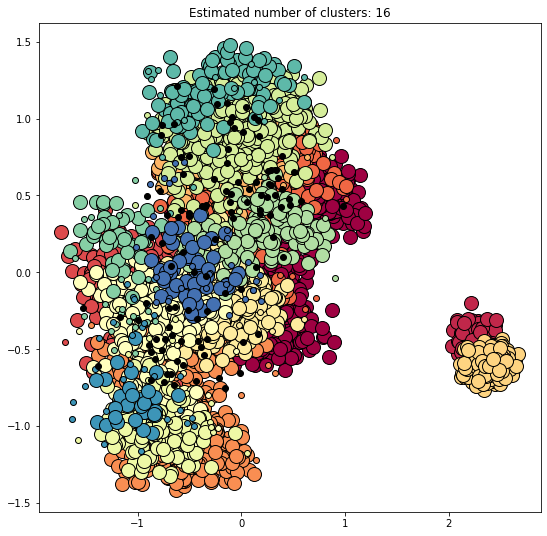

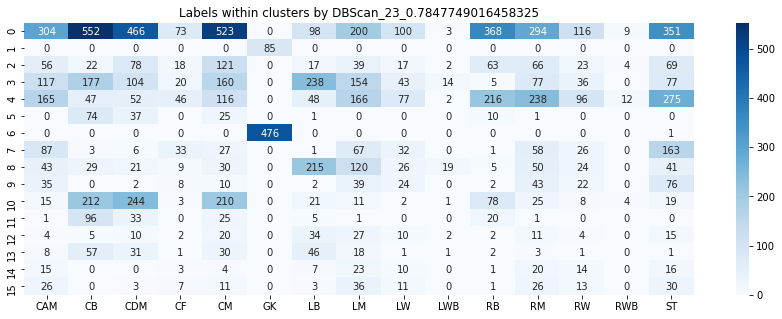

Using minpts - 24
start = 100, end = -300
eps_idx = 6048, eps = 0.8118723461752348


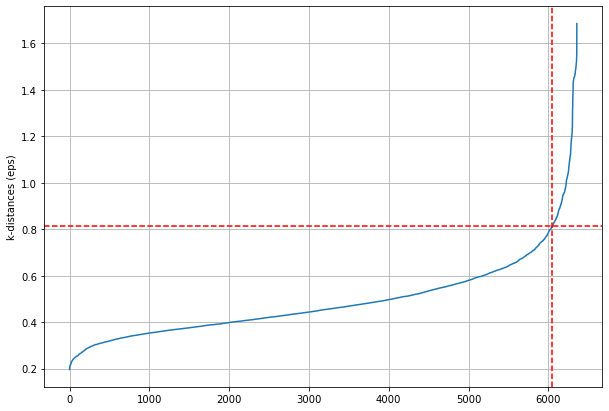

Estimated number of clusters: 16
Estimated number of noise points: 104
Silhouette Coefficient: 0.393


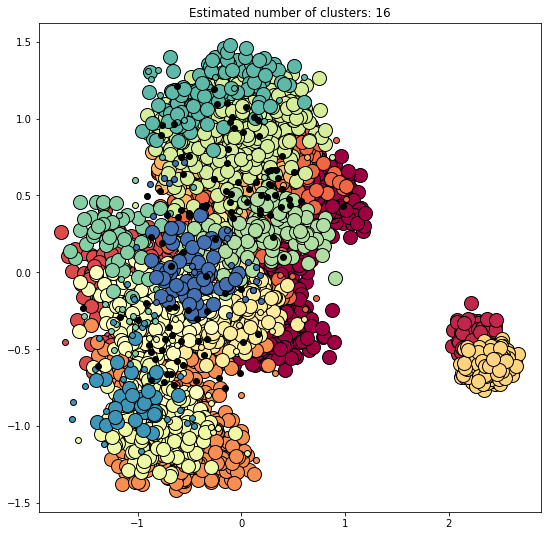

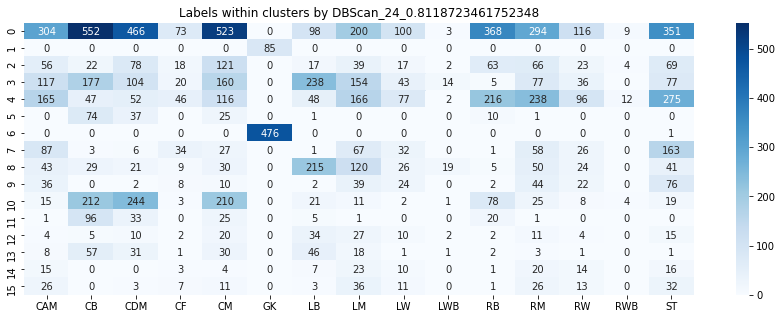

Using minpts - 25
start = 100, end = -300
eps_idx = 6054, eps = 0.8226482170566399


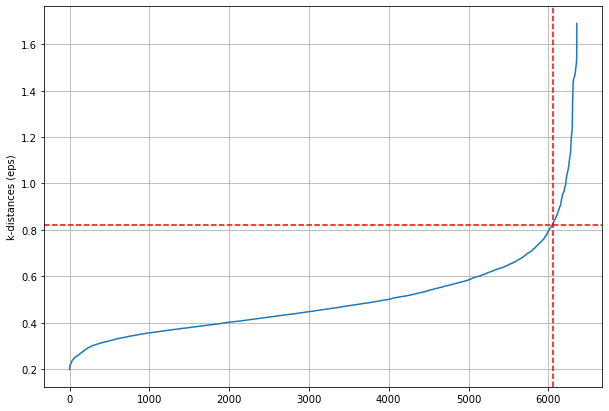

Estimated number of clusters: 16
Estimated number of noise points: 101
Silhouette Coefficient: 0.393


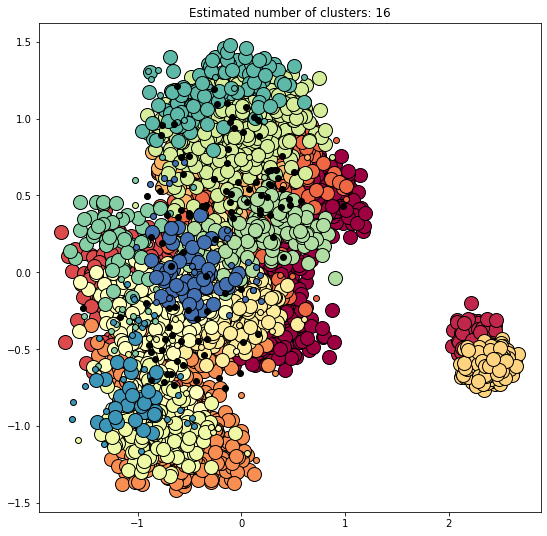

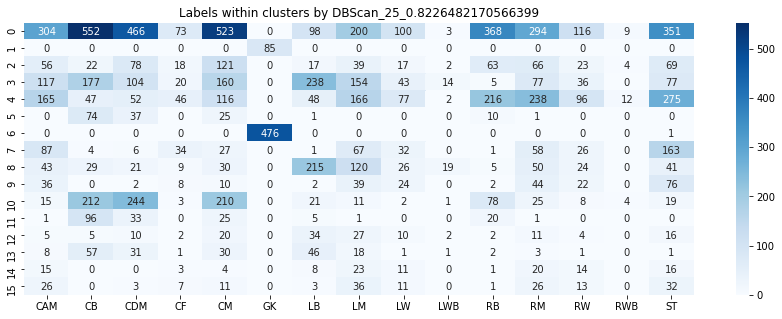

Using minpts - 26
start = 100, end = -300
eps_idx = 5939, eps = 0.767856407682211


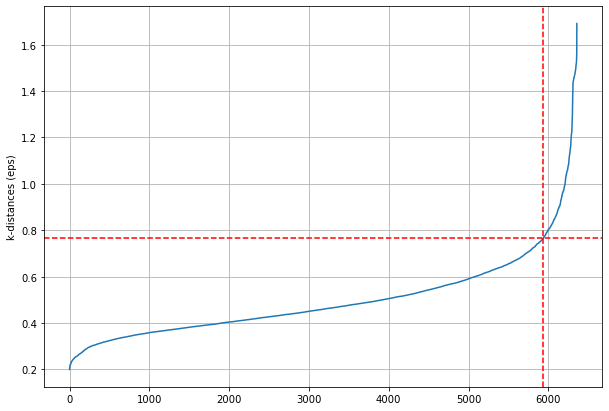

Estimated number of clusters: 16
Estimated number of noise points: 114
Silhouette Coefficient: 0.391


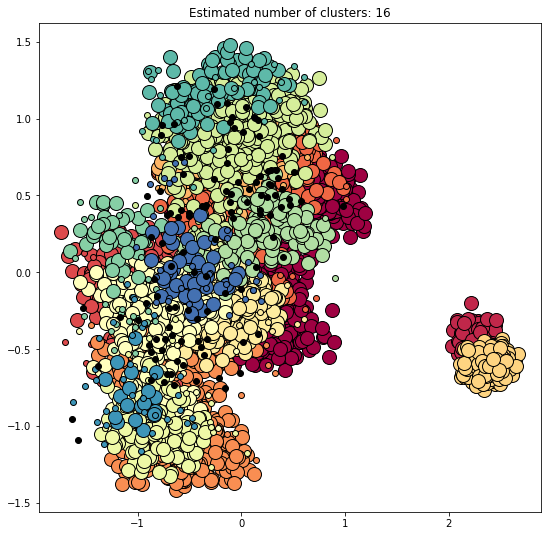

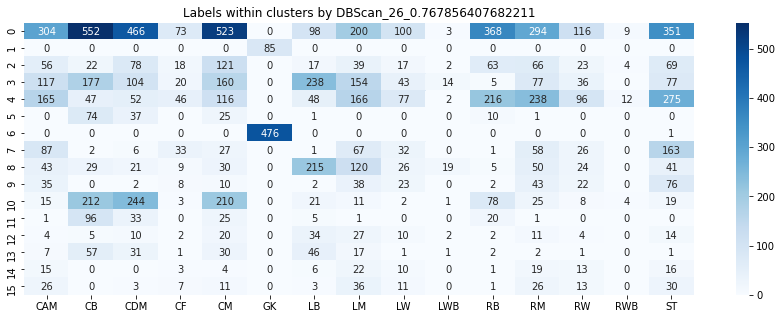

Using minpts - 27
start = 100, end = -300
eps_idx = 6034, eps = 0.8266729708428229


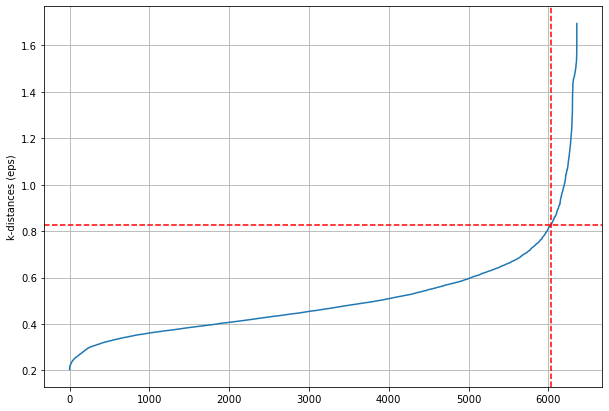

Estimated number of clusters: 16
Estimated number of noise points: 102
Silhouette Coefficient: 0.393


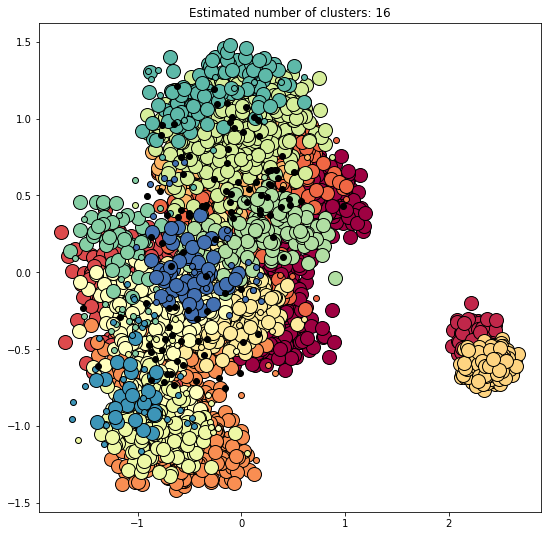

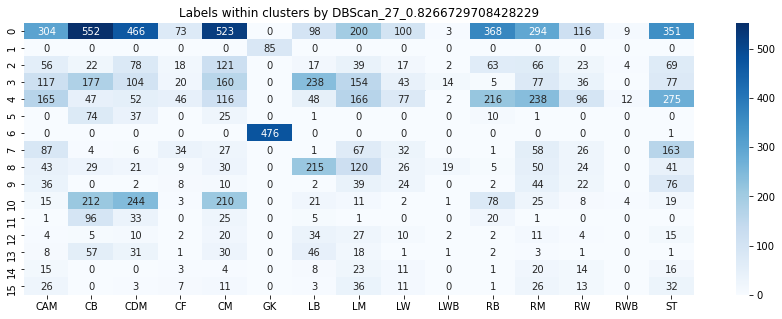

Using minpts - 28
start = 100, end = -300
eps_idx = 6005, eps = 0.8214756922095434


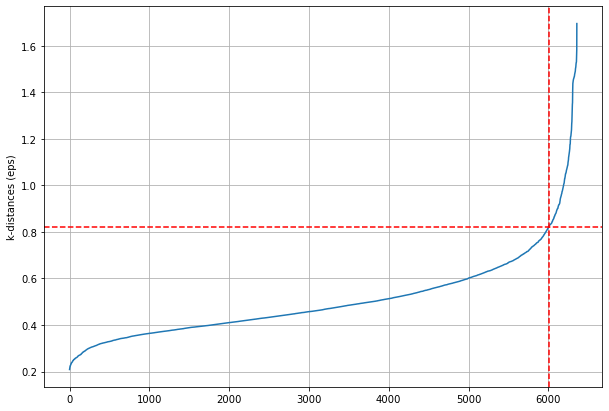

Estimated number of clusters: 16
Estimated number of noise points: 103
Silhouette Coefficient: 0.393


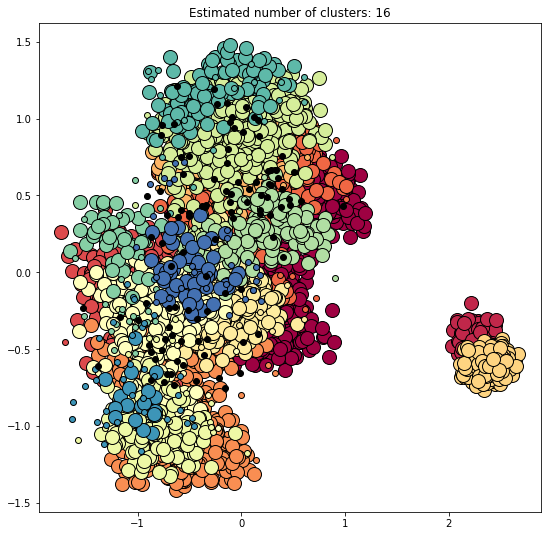

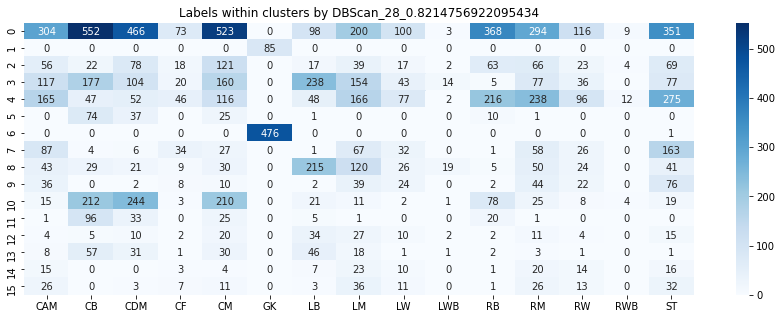

Using minpts - 29
start = 100, end = -300
eps_idx = 6046, eps = 0.8530739344595007


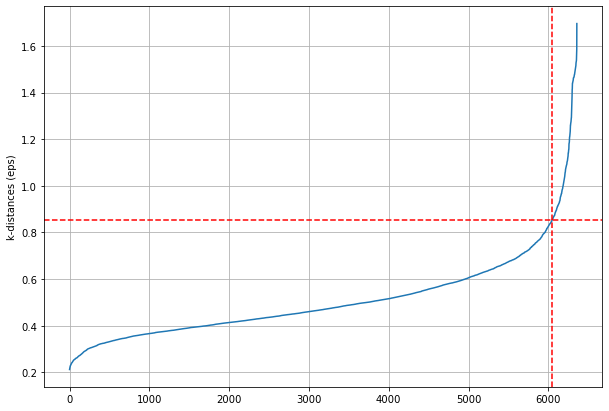

Estimated number of clusters: 16
Estimated number of noise points: 95
Silhouette Coefficient: 0.394


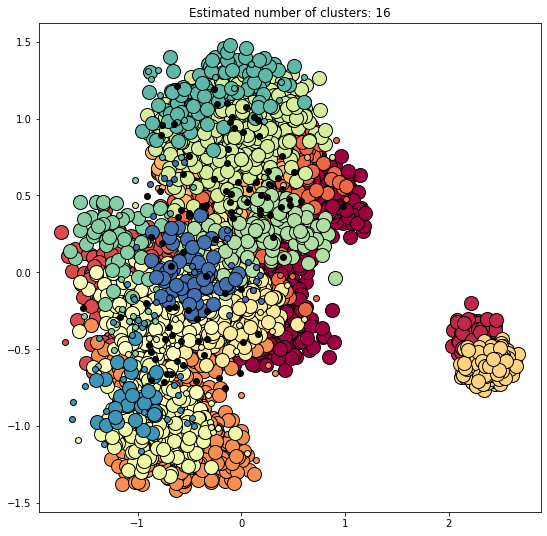

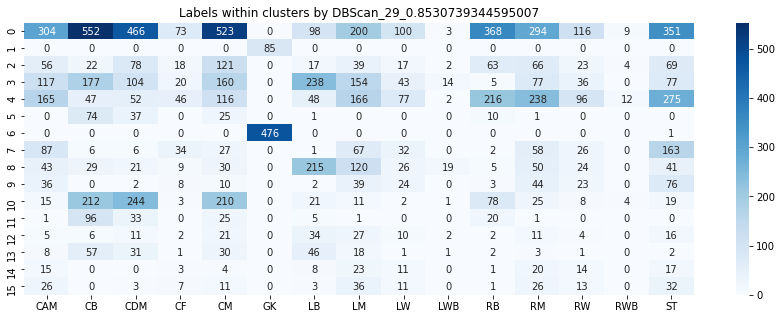

Using minpts - 30
start = 100, end = -300
eps_idx = 6032, eps = 0.849378129282582


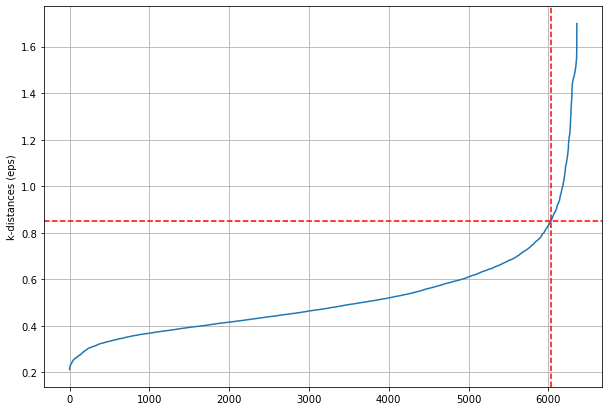

Estimated number of clusters: 16
Estimated number of noise points: 99
Silhouette Coefficient: 0.393


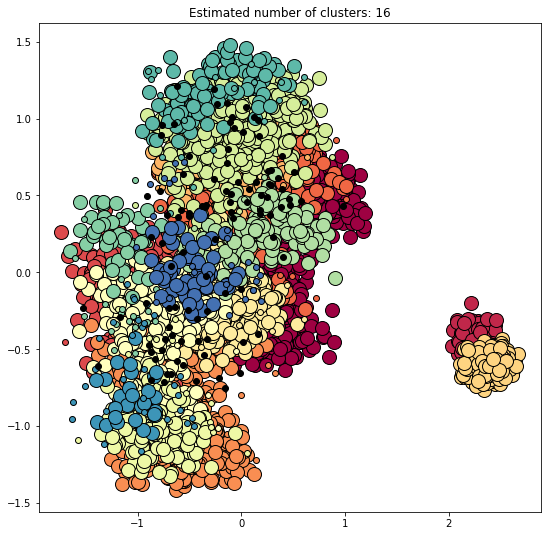

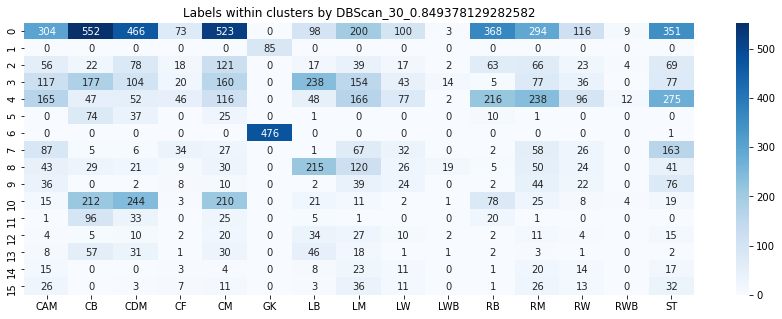

Using minpts - 31
start = 100, end = -300
eps_idx = 5949, eps = 0.8074404016546458


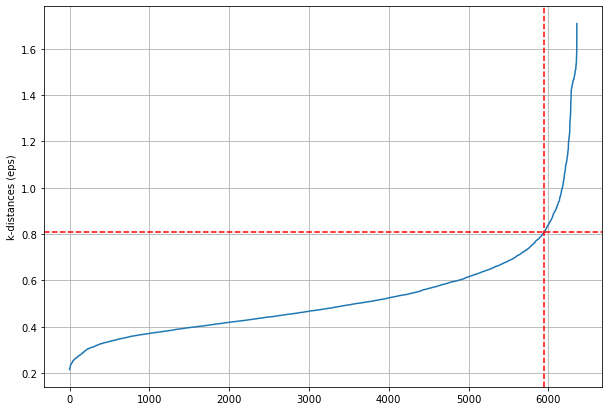

Estimated number of clusters: 16
Estimated number of noise points: 106
Silhouette Coefficient: 0.392


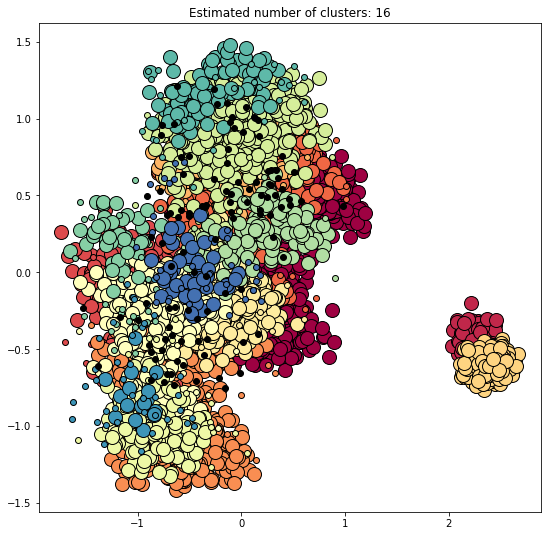

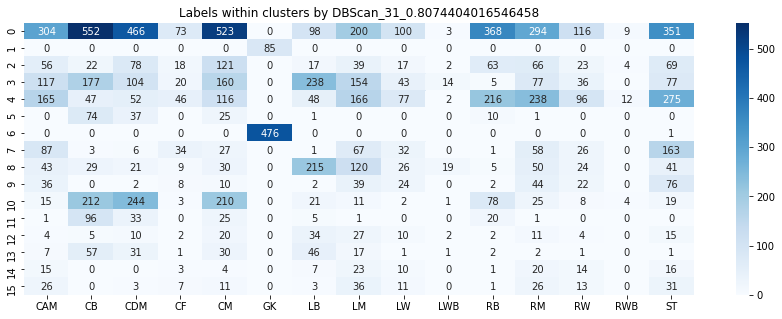

Using minpts - 32
start = 100, end = -300
eps_idx = 6039, eps = 0.8761367911975005


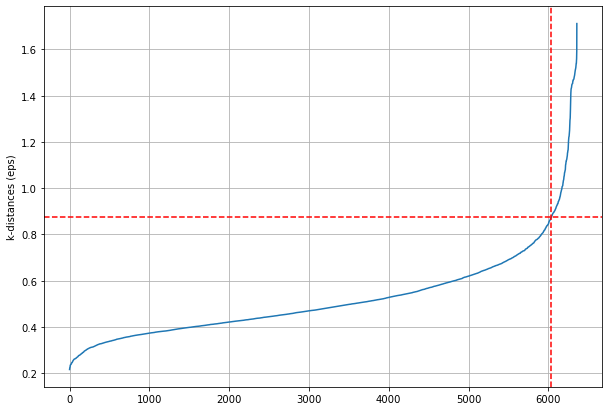

Estimated number of clusters: 16
Estimated number of noise points: 94
Silhouette Coefficient: 0.394


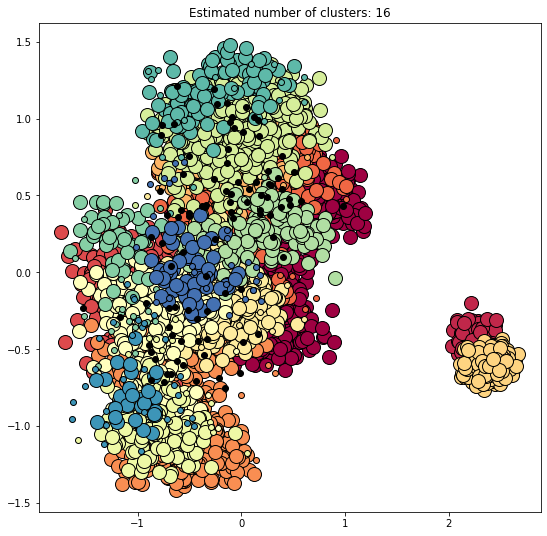

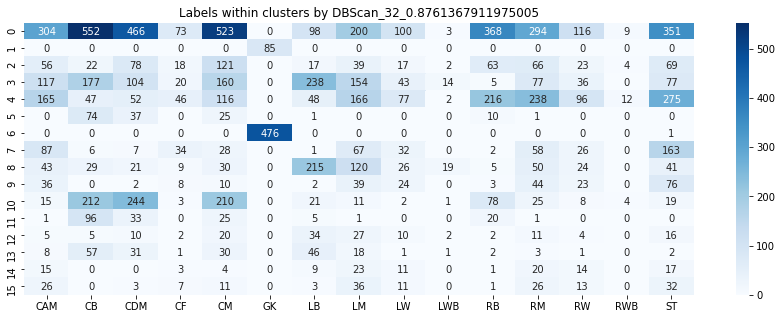

Using minpts - 33
start = 100, end = -300
eps_idx = 6006, eps = 0.8553197800663676


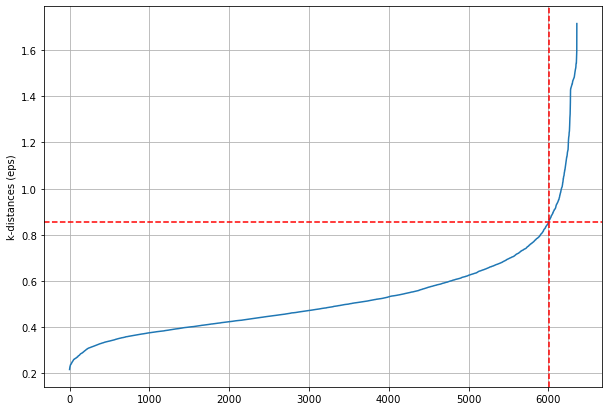

Estimated number of clusters: 16
Estimated number of noise points: 97
Silhouette Coefficient: 0.394


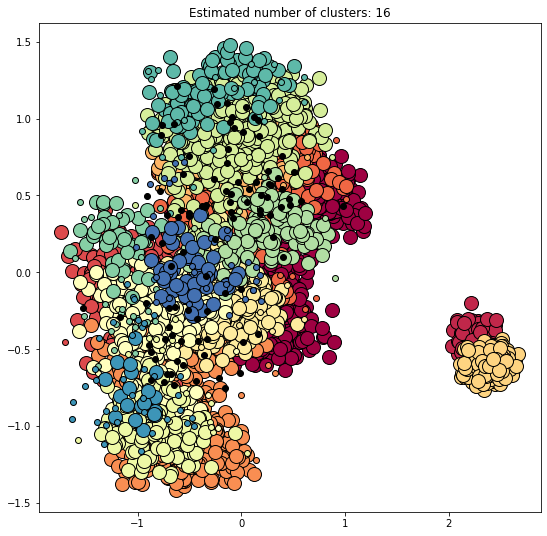

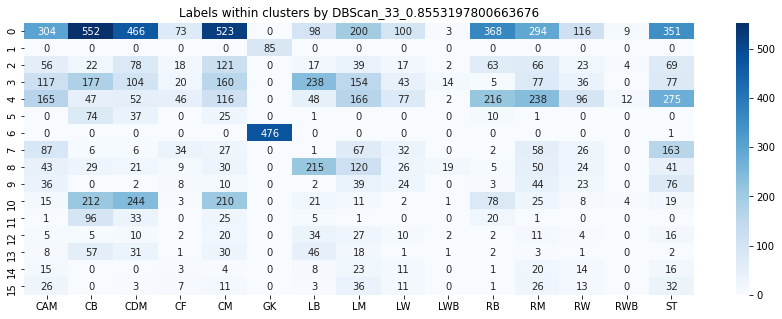

In [8]:
# Do DBScan

for mp in MIN_PTS:
    print('Using minpts - {}'.format(mp))
    dist = kth_neighbour(mp)
    idx, eps = find_eps(dist)
    plot_kdist(dist, idx)
    try_dbscan(X, eps, mp)

In [21]:
# PCA: no labels
df = all_dfs[4]
df.head(2)

,Unnamed: 0,player_positions,player_fifa_api_id,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,player_positions_general
0,0,CB,218353,0.378084,0.493866,-0.218586,-0.238711,-0.500447,0.219325,0.125196,-0.119898,-0.141964,0.142511,-0.056706,0.011622,0.019336,0.023303,DEF
1,1,LB,189615,-1.046989,-0.190204,1.120495,0.563388,-0.440816,-0.198932,0.338791,0.223150,0.041387,-0.025337,0.229595,0.055748,-0.099781,0.020387,DEF


In [22]:
y = df['player_positions']
X = df.drop(columns=['Unnamed: 0', 'player_positions', 'player_fifa_api_id','player_positions_general'])

labels = []
for l in y.values:
    if ',' in l:
        labels.extend(l.split(", "))
    else:
        labels.append(l)

labels, counts = np.unique(labels, return_counts=True)

n_features = len(X.columns)
MIN_PTS = [i for i in range((n_features*2)-5, (n_features*2)+6)]

Using minpts - 23
start = 100, end = -300
eps_idx = 6014, eps = 0.7841729603027225


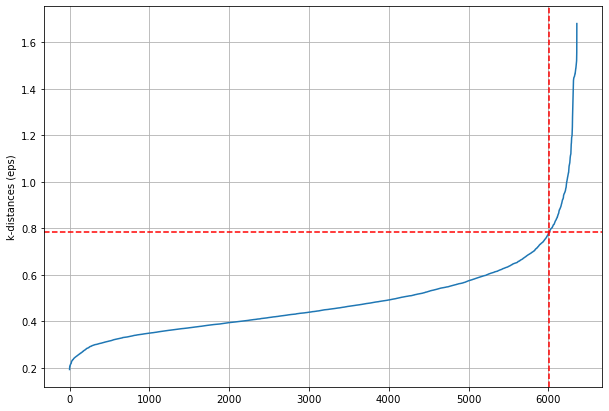

Estimated number of clusters: 17
Estimated number of noise points: 85
Silhouette Coefficient: 0.392


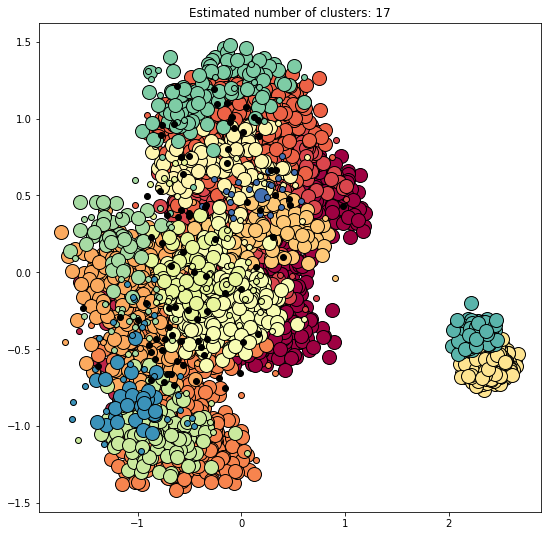

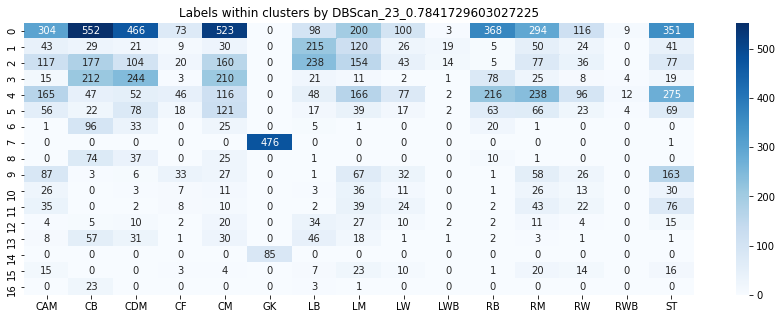

Using minpts - 24
start = 100, end = -300
eps_idx = 6003, eps = 0.7863214339973075


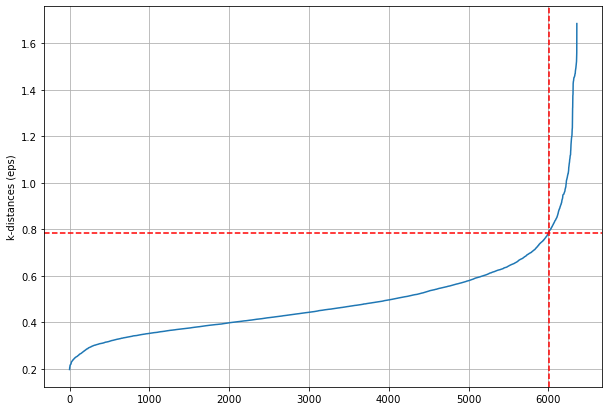

Estimated number of clusters: 16
Estimated number of noise points: 107
Silhouette Coefficient: 0.392


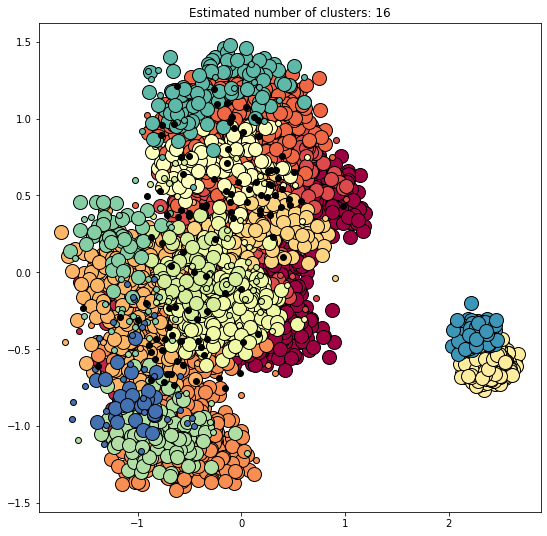

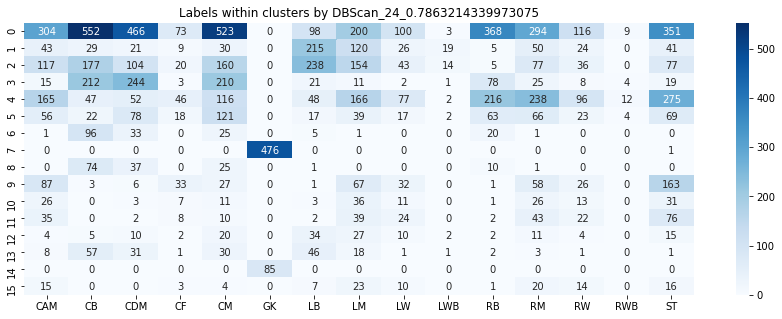

Using minpts - 25
start = 100, end = -300
eps_idx = 5947, eps = 0.763092767404534


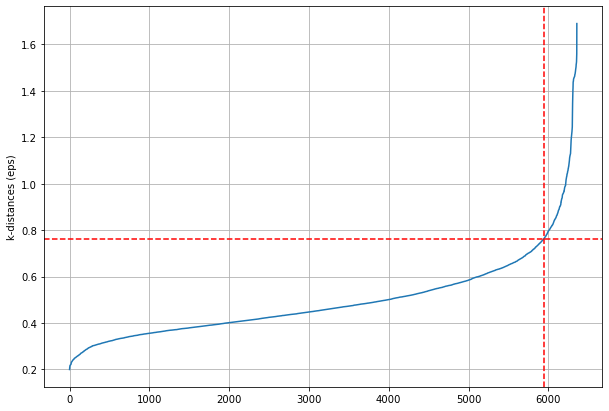

Estimated number of clusters: 16
Estimated number of noise points: 115
Silhouette Coefficient: 0.391


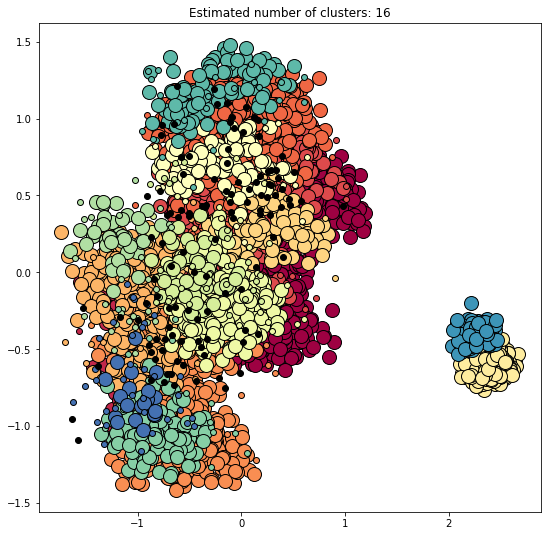

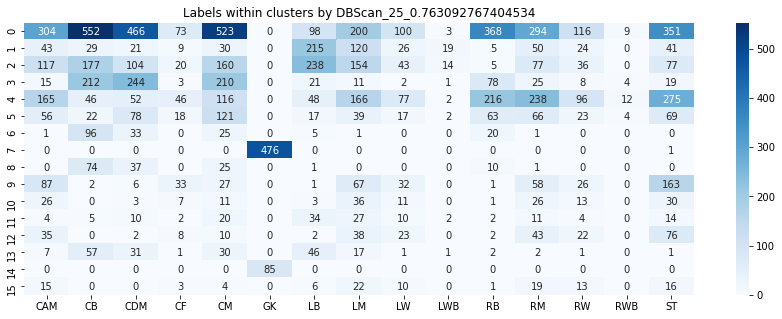

Using minpts - 26
start = 100, end = -300
eps_idx = 5989, eps = 0.7946484305248697


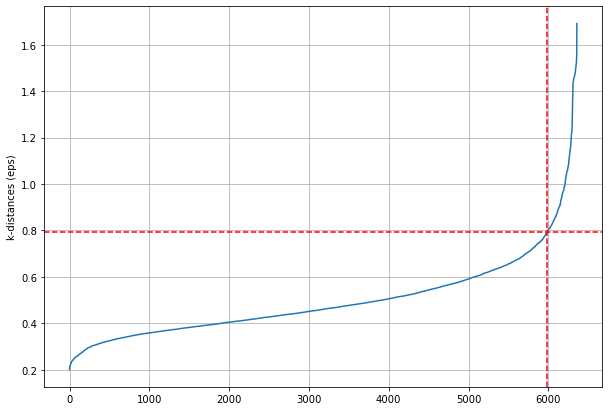

Estimated number of clusters: 16
Estimated number of noise points: 106
Silhouette Coefficient: 0.392


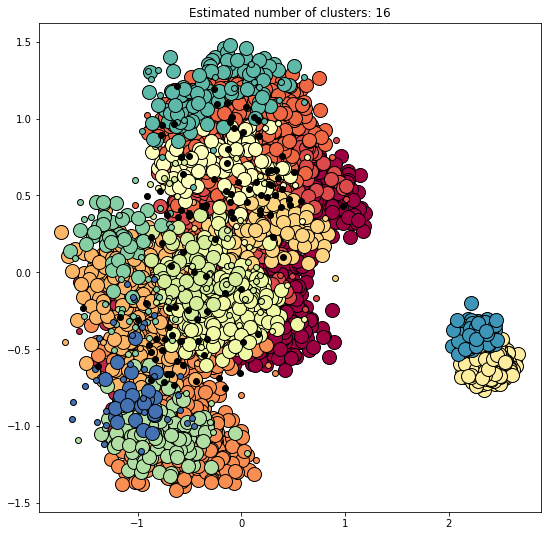

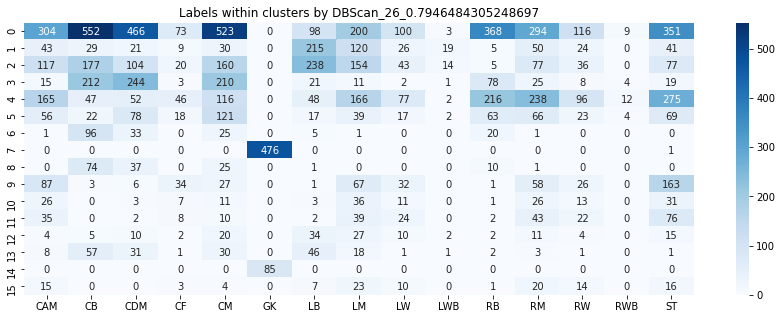

Using minpts - 27
start = 100, end = -300
eps_idx = 6001, eps = 0.8120740214723057


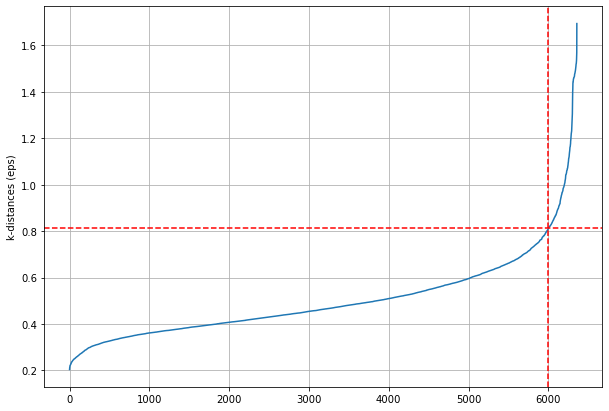

Estimated number of clusters: 16
Estimated number of noise points: 104
Silhouette Coefficient: 0.393


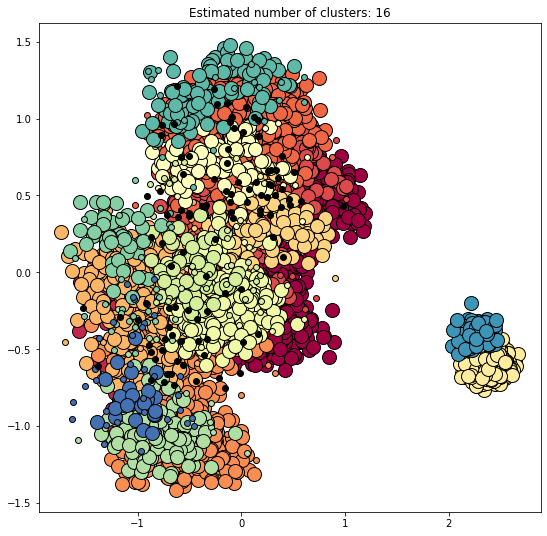

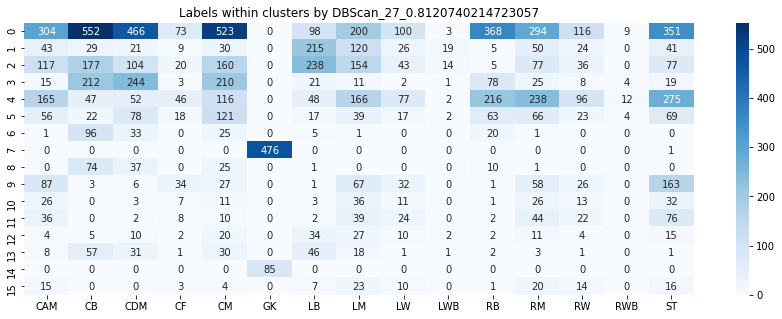

Using minpts - 28
start = 100, end = -300
eps_idx = 6043, eps = 0.8405484171913807


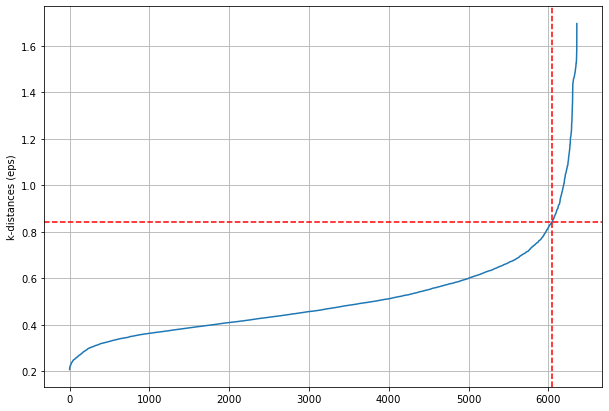

Estimated number of clusters: 16
Estimated number of noise points: 99
Silhouette Coefficient: 0.393


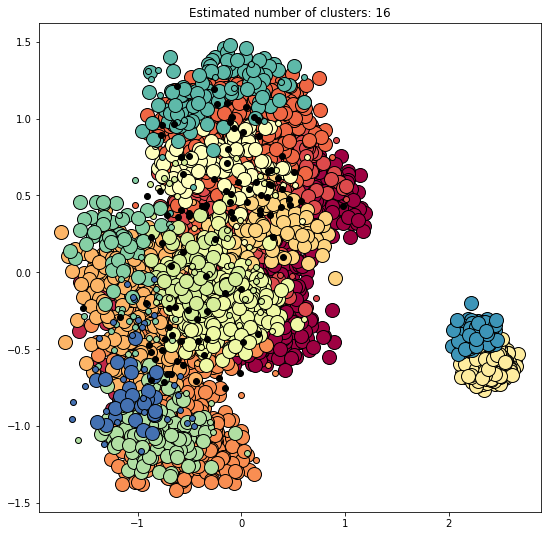

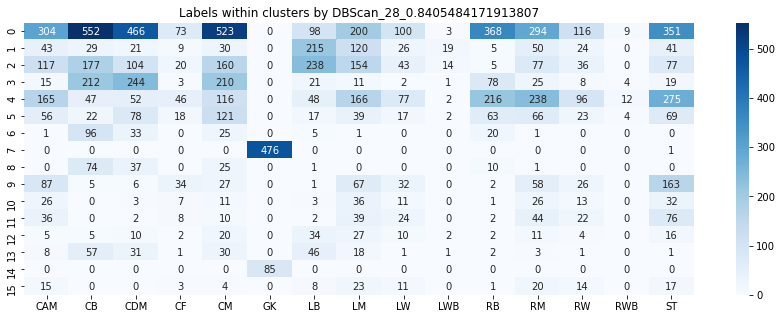

Using minpts - 29
start = 100, end = -300
eps_idx = 6041, eps = 0.8481986762375741


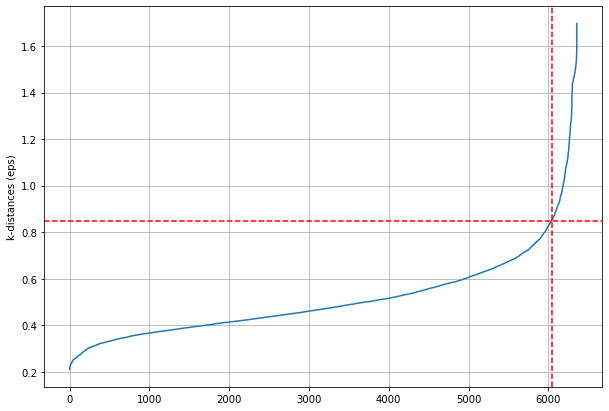

Estimated number of clusters: 16
Estimated number of noise points: 97
Silhouette Coefficient: 0.394


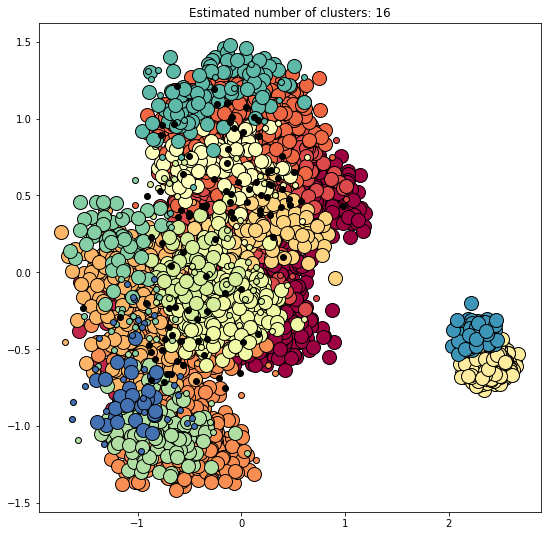

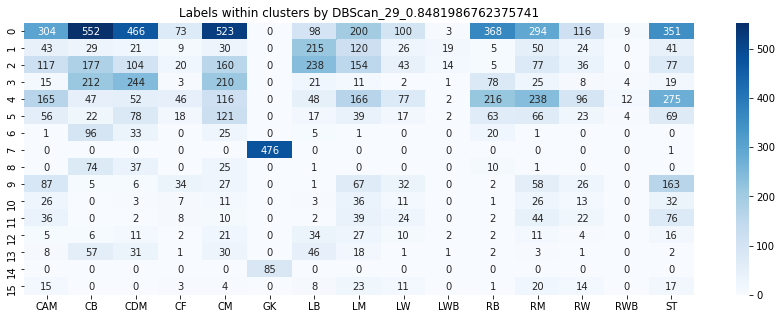

Using minpts - 30
start = 100, end = -300
eps_idx = 6041, eps = 0.8567801791975634


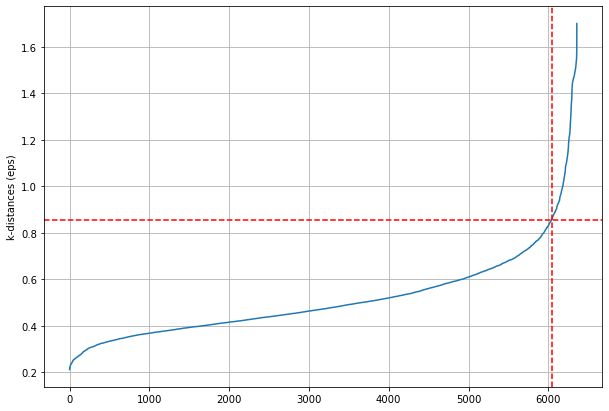

Estimated number of clusters: 16
Estimated number of noise points: 94
Silhouette Coefficient: 0.394


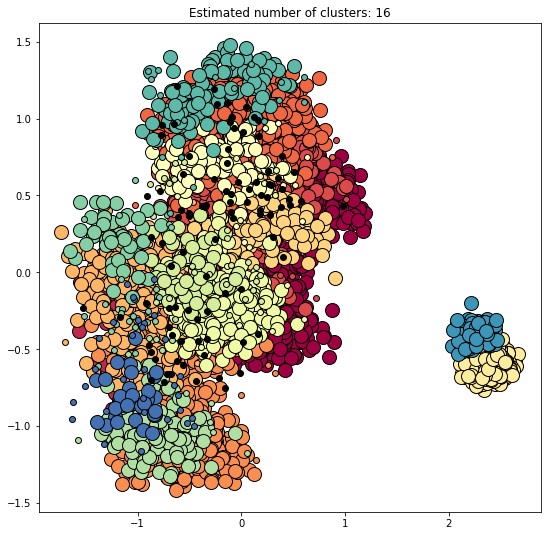

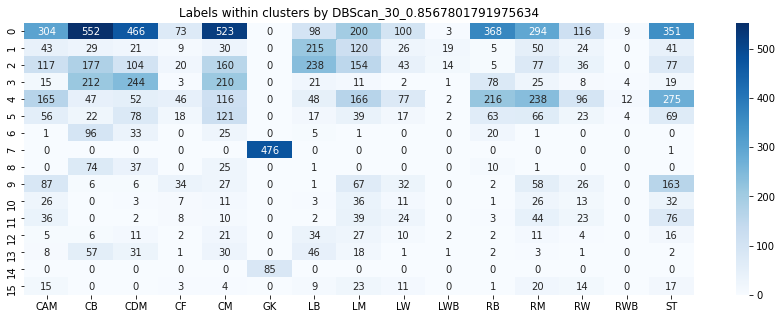

Using minpts - 31
start = 100, end = -300
eps_idx = 6049, eps = 0.8717580011254699


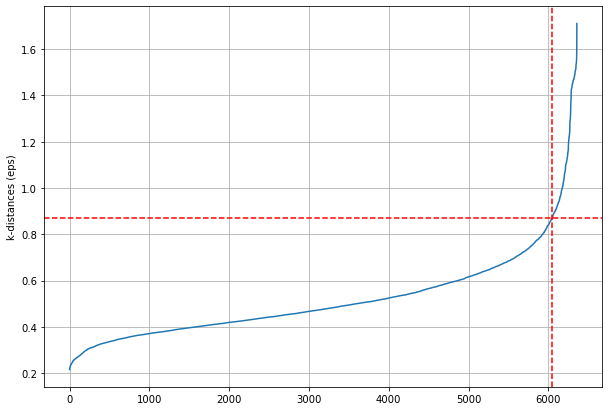

Estimated number of clusters: 16
Estimated number of noise points: 93
Silhouette Coefficient: 0.394


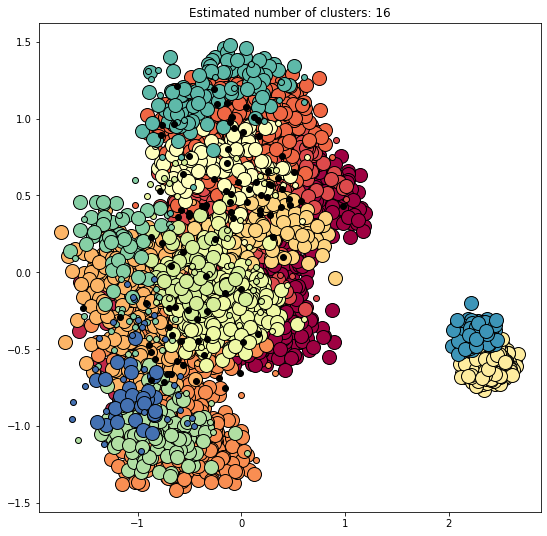

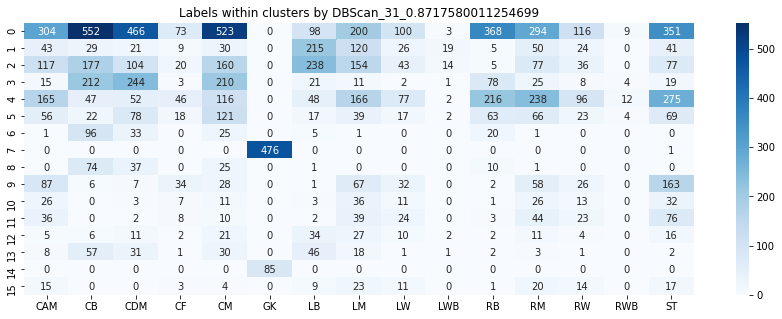

Using minpts - 32
start = 100, end = -300
eps_idx = 6023, eps = 0.8633363600870405


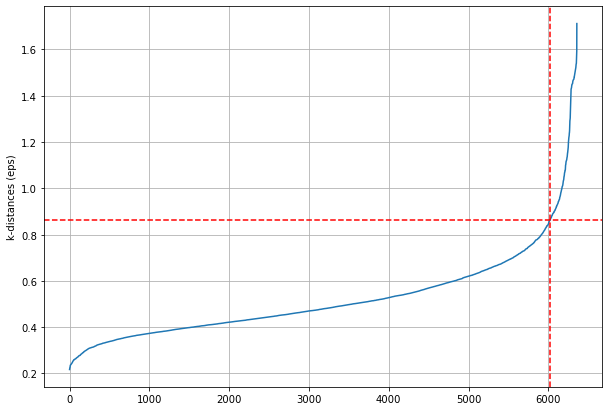

Estimated number of clusters: 16
Estimated number of noise points: 96
Silhouette Coefficient: 0.394


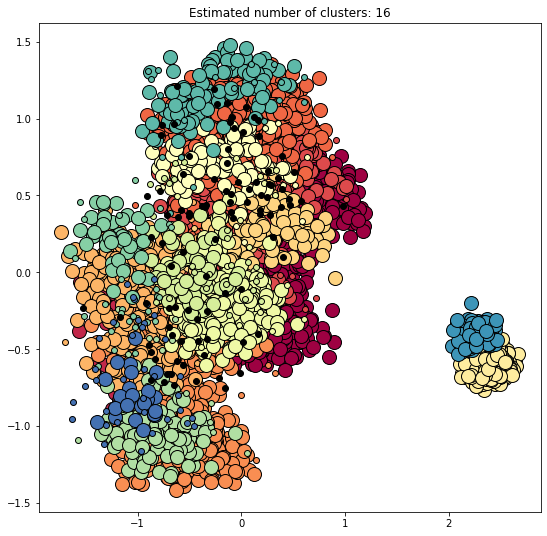

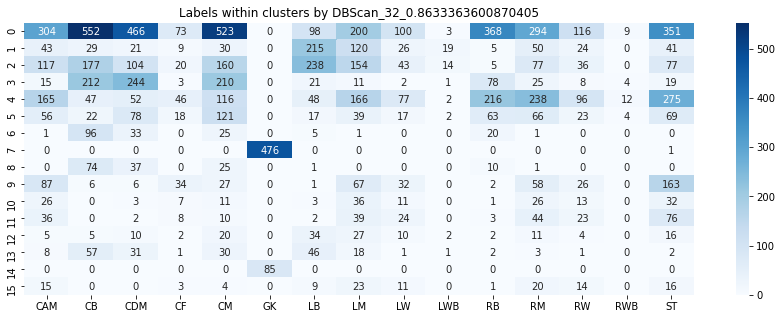

Using minpts - 33
start = 100, end = -300
eps_idx = 6006, eps = 0.8563244469605322


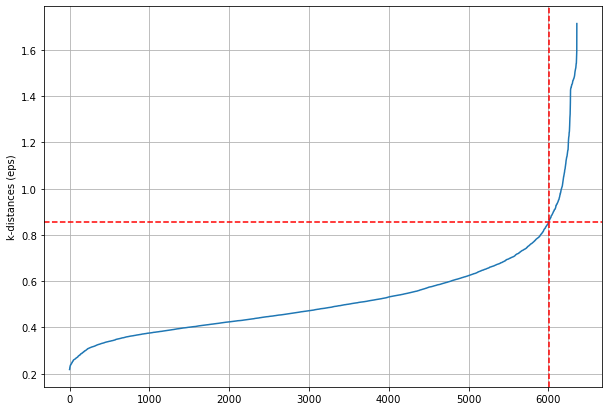

Estimated number of clusters: 16
Estimated number of noise points: 97
Silhouette Coefficient: 0.394


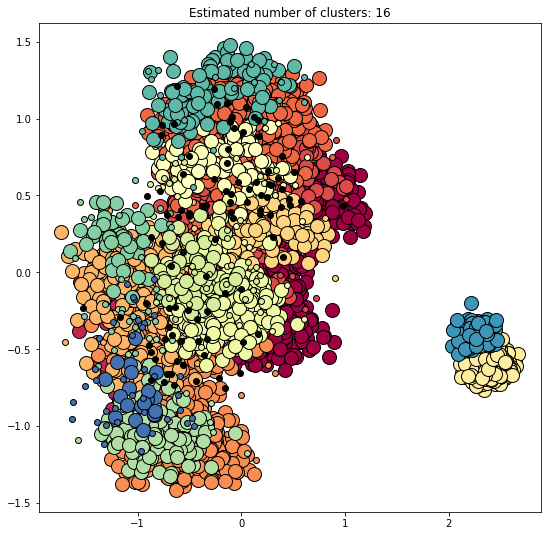

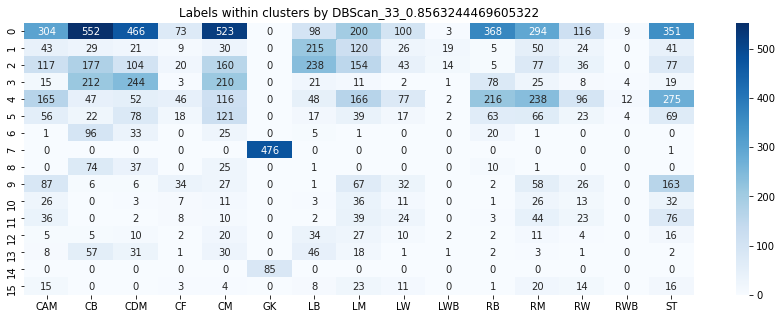

In [23]:
# Do DBScan

for mp in MIN_PTS:
    print('Using minpts - {}'.format(mp))
    dist = kth_neighbour(mp)
    idx, eps = find_eps(dist)
    plot_kdist(dist, idx)
    try_dbscan(X, eps, mp)

In [24]:
# DNN_V2: DNN_player_embeddings_v2.csv
df = all_dfs[0]
df.head(2)

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,29,30,31,id,player_fifa_api_id,player_api_id,date,player_name,player_positions,player_positions_general
0,0,1.409394,-0.644381,-0.690456,-0.797573,0.199402,-0.089646,-0.410039,-0.336073,-0.423743,...,-0.604337,-0.135848,-0.575796,1,218353,505942,2016-02-18,Aaron Appindangoye,CB,DEF
1,1,1.540995,-0.637391,-0.747262,-0.865316,0.261265,-0.305409,-0.783761,-0.702415,-0.676207,...,-0.902550,-0.446335,-0.808141,6,189615,155782,2016-04-21,Aaron Cresswell,LB,DEF


In [26]:
y = df['player_positions']
X = df.drop(columns=['Unnamed: 0', 'id','player_positions', 'player_fifa_api_id','player_positions_general',
                     'player_api_id','date','player_name'])

labels = []
for l in y.values:
    if ',' in l:
        labels.extend(l.split(", "))
    else:
        labels.append(l)

labels, counts = np.unique(labels, return_counts=True)

n_features = len(X.columns)
MIN_PTS = [i for i in range((n_features*2)-5, (n_features*2)+6)]

Using minpts - 59
start = 100, end = -300
eps_idx = 5886, eps = 0.5765266204888306


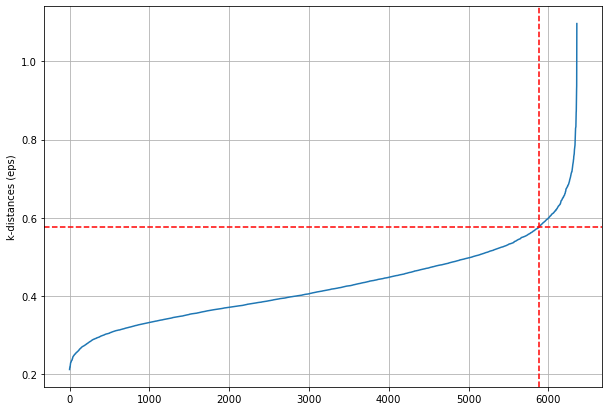

Estimated number of clusters: 2
Estimated number of noise points: 16
Silhouette Coefficient: 0.340


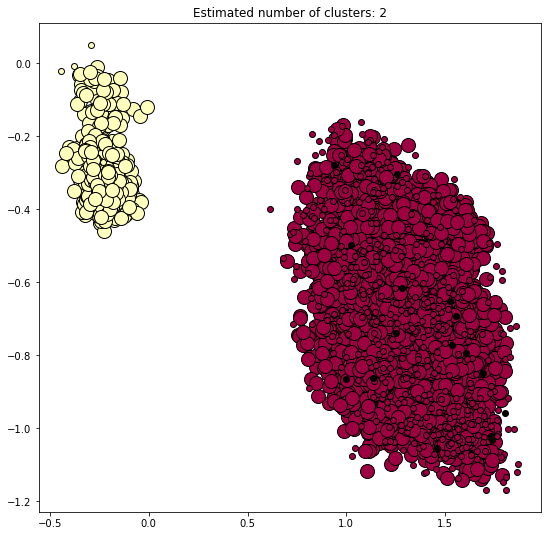

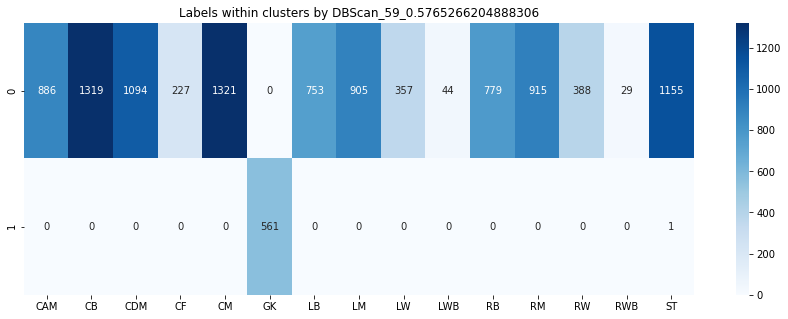

Using minpts - 60
start = 100, end = -300
eps_idx = 6022, eps = 0.6052246230212003


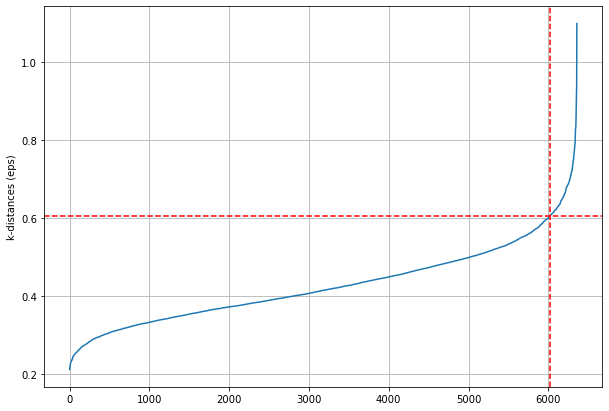

Estimated number of clusters: 2
Estimated number of noise points: 8
Silhouette Coefficient: 0.336


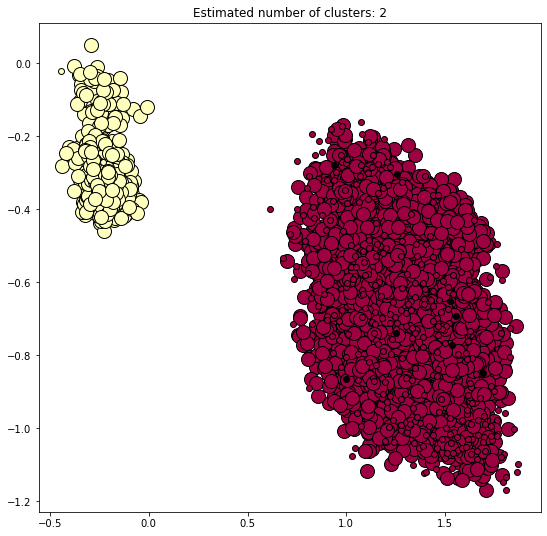

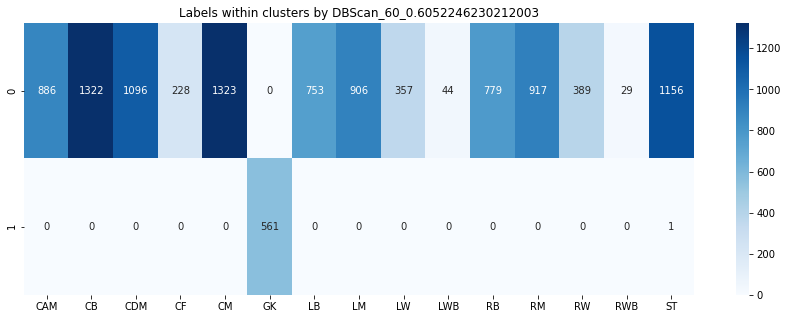

Using minpts - 61
start = 100, end = -300
eps_idx = 6021, eps = 0.6067777314826479


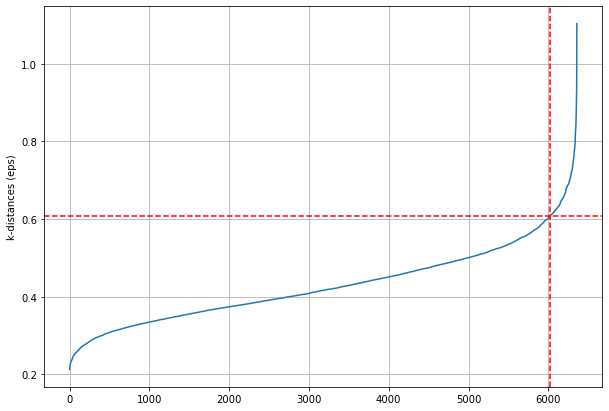

Estimated number of clusters: 2
Estimated number of noise points: 7
Silhouette Coefficient: 0.332


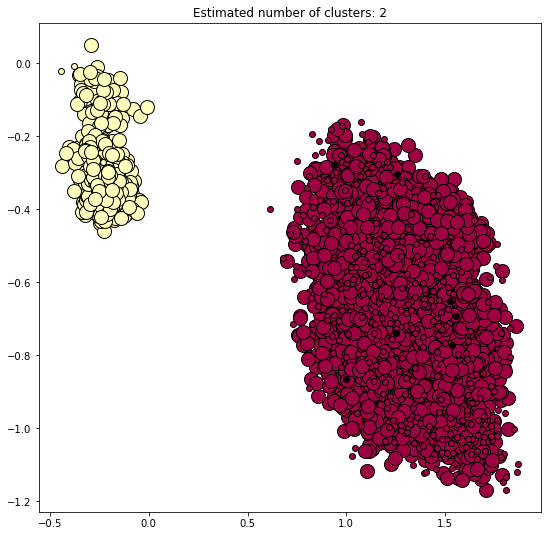

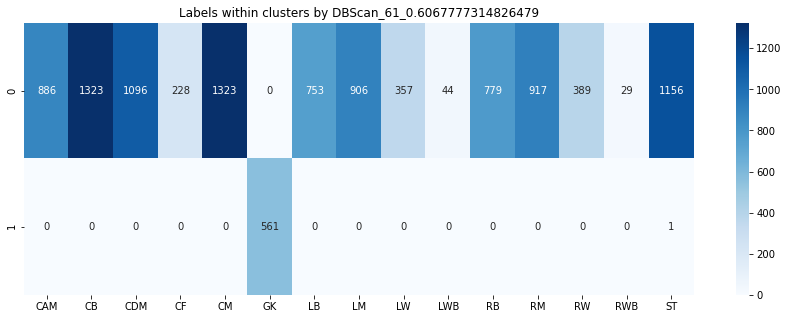

Using minpts - 62
start = 100, end = -300
eps_idx = 5940, eps = 0.5931177069445207


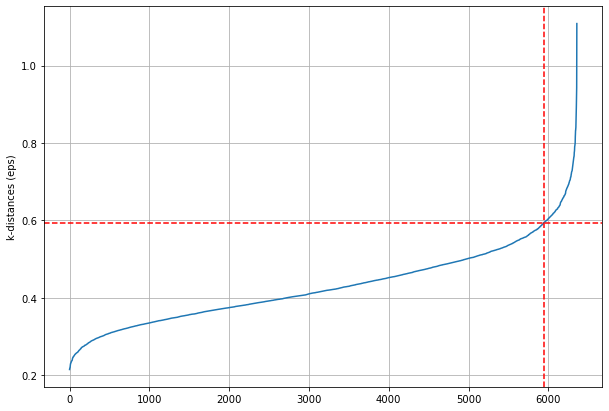

Estimated number of clusters: 2
Estimated number of noise points: 11
Silhouette Coefficient: 0.349


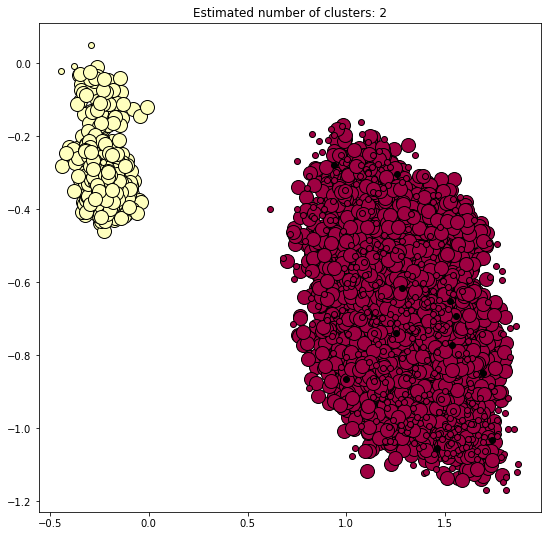

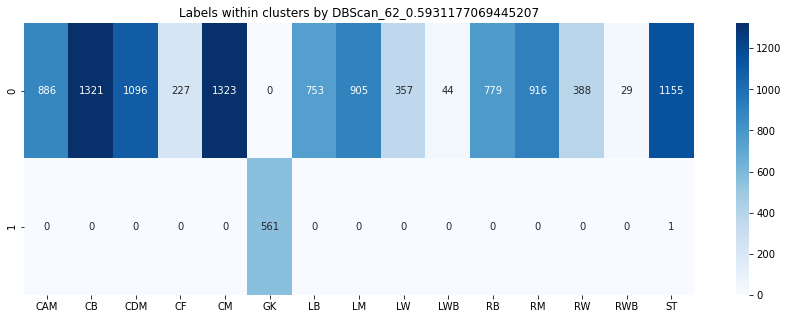

Using minpts - 63
start = 100, end = -300
eps_idx = 6020, eps = 0.6109481919339201


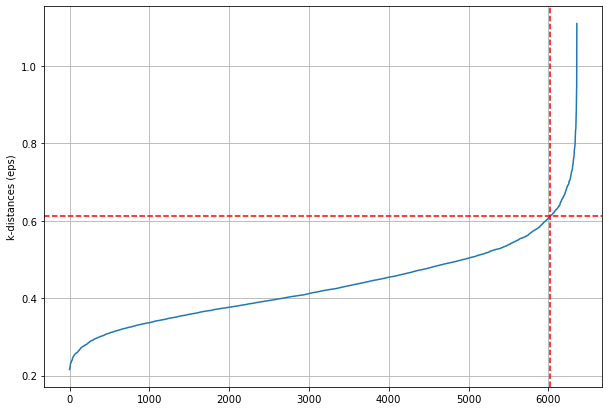

Estimated number of clusters: 2
Estimated number of noise points: 7
Silhouette Coefficient: 0.332


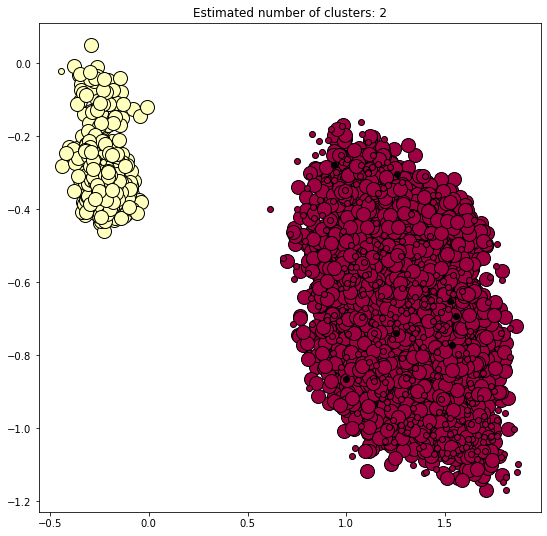

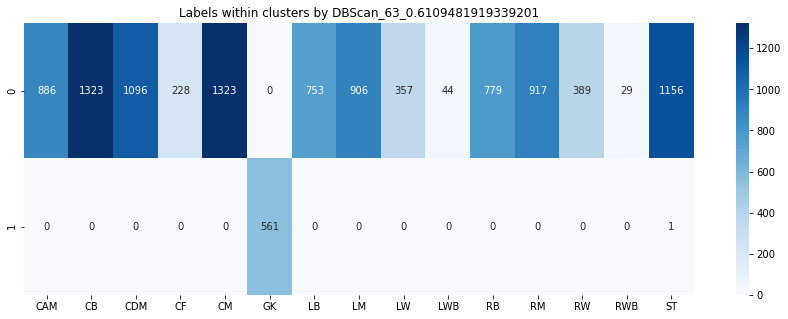

Using minpts - 64
start = 100, end = -300
eps_idx = 6031, eps = 0.6143764768714444


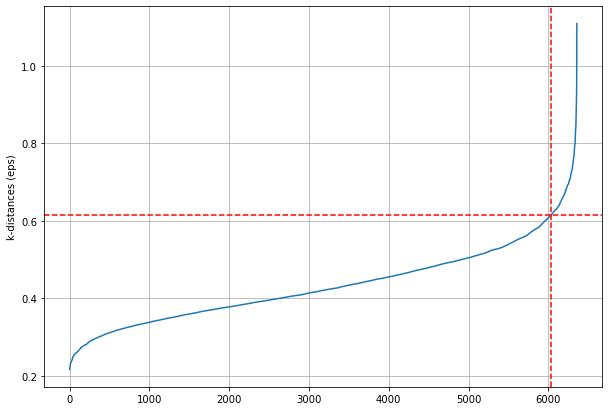

Estimated number of clusters: 2
Estimated number of noise points: 8
Silhouette Coefficient: 0.336


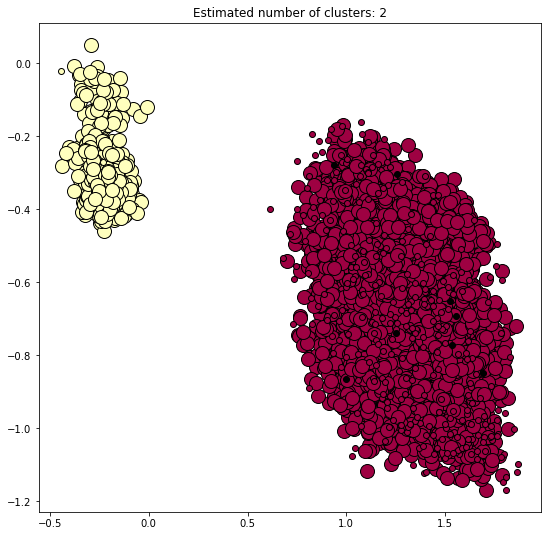

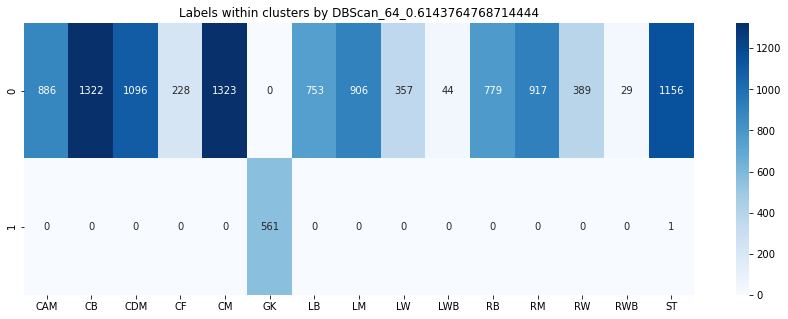

Using minpts - 65
start = 100, end = -300
eps_idx = 6010, eps = 0.6122270754864524


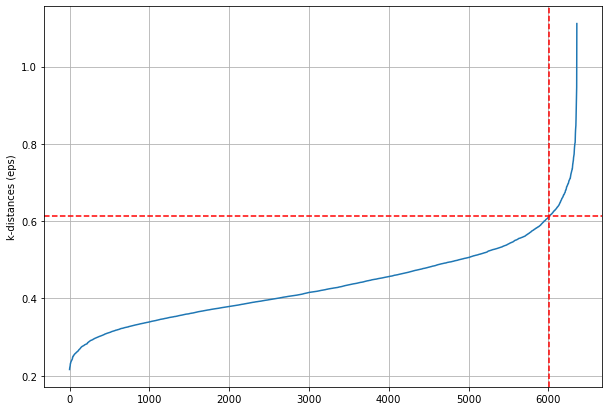

Estimated number of clusters: 2
Estimated number of noise points: 9
Silhouette Coefficient: 0.342


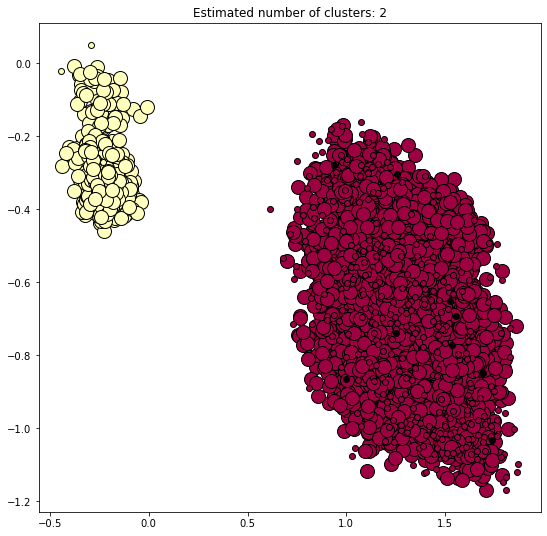

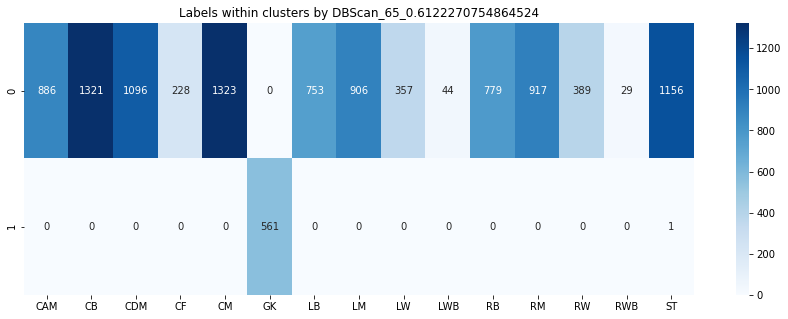

Using minpts - 66
start = 100, end = -300
eps_idx = 5917, eps = 0.5943715931306056


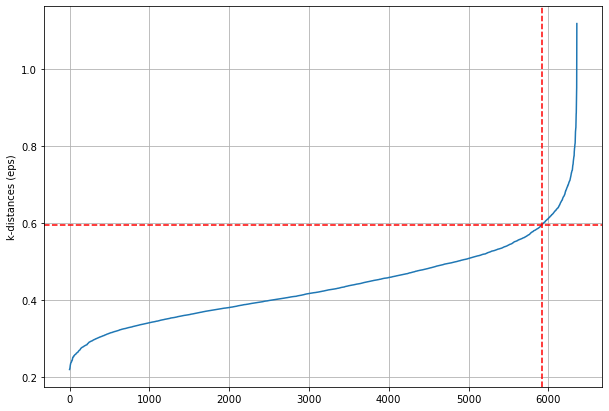

Estimated number of clusters: 2
Estimated number of noise points: 11
Silhouette Coefficient: 0.349


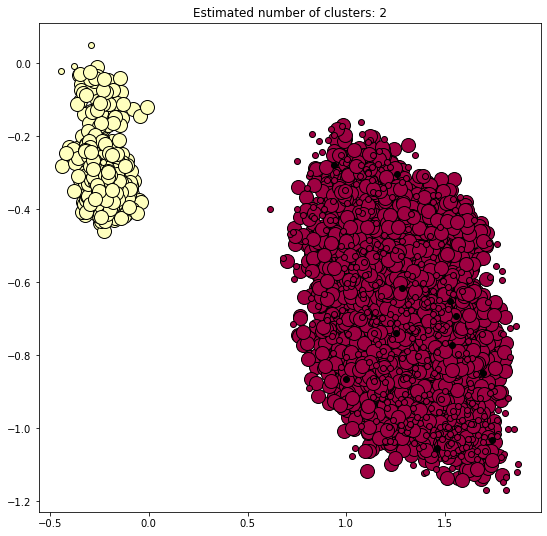

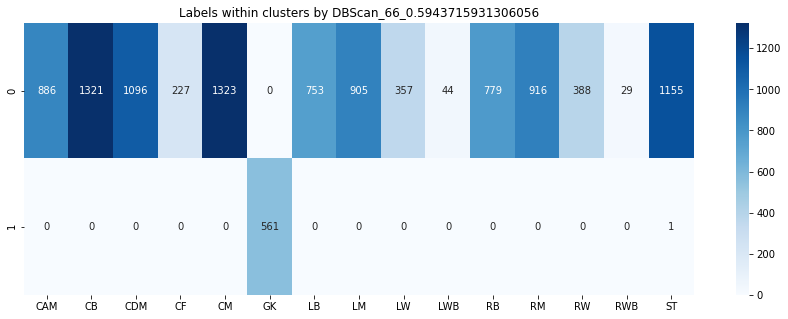

Using minpts - 67
start = 100, end = -300
eps_idx = 6052, eps = 0.6241571862278219


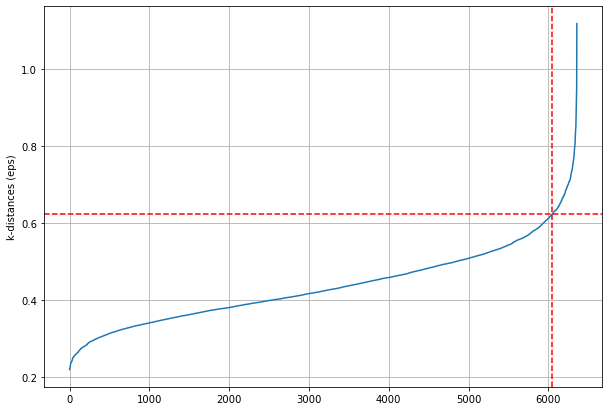

Estimated number of clusters: 2
Estimated number of noise points: 6
Silhouette Coefficient: 0.370


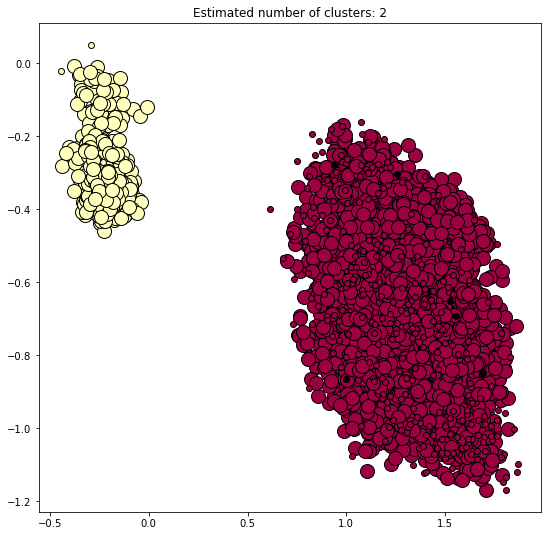

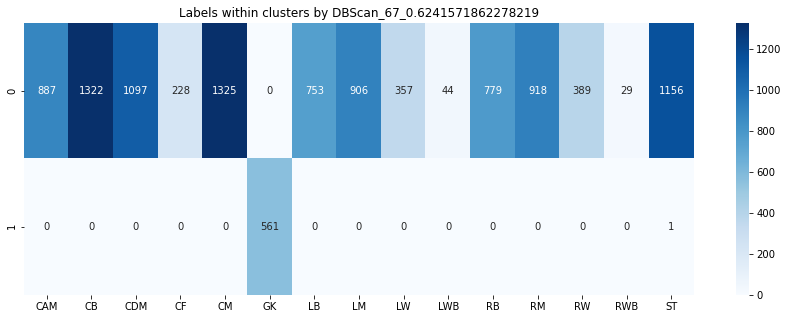

Using minpts - 68
start = 100, end = -300
eps_idx = 103, eps = 0.26517701254189247


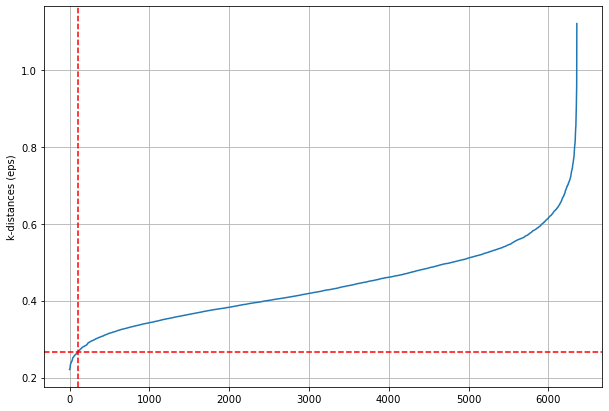

Estimated number of clusters: 1
Estimated number of noise points: 5958
Silhouette Coefficient: 0.641


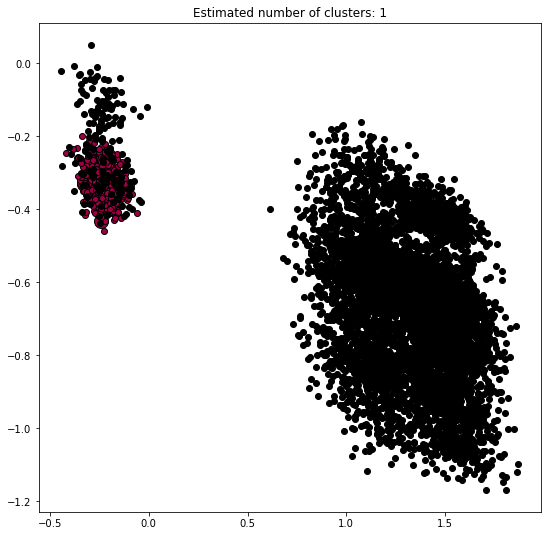

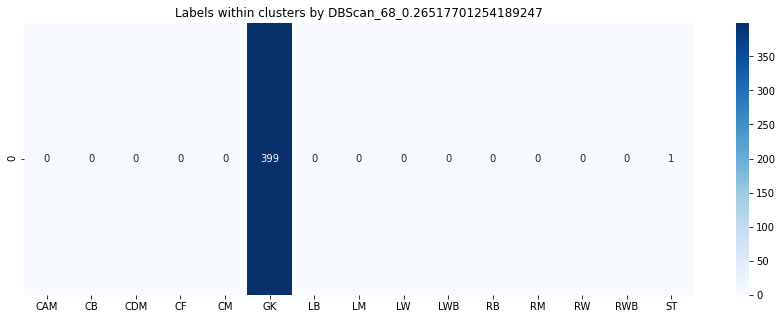

Using minpts - 69
start = 100, end = -300
eps_idx = 102, eps = 0.26595398656315666


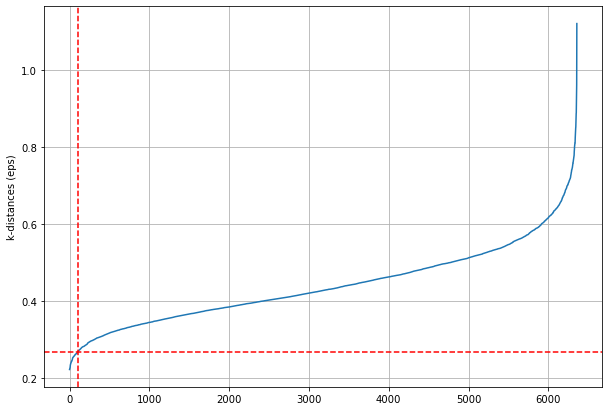

Estimated number of clusters: 1
Estimated number of noise points: 5959
Silhouette Coefficient: 0.640


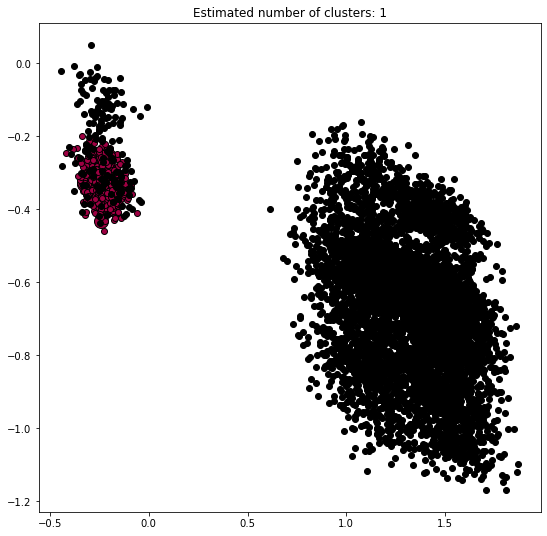

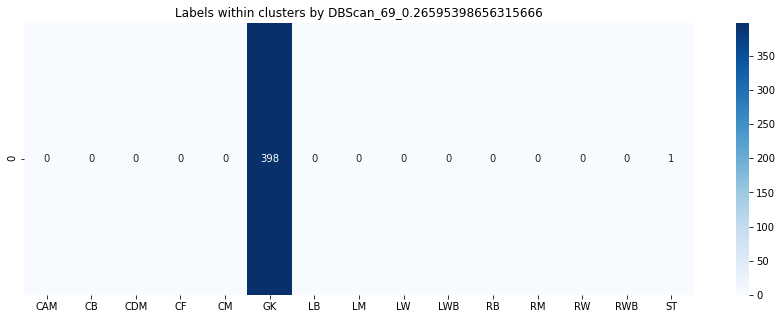

In [27]:
# Do DBScan
for mp in MIN_PTS:
    print('Using minpts - {}'.format(mp))
    dist = kth_neighbour(mp)
    idx, eps = find_eps(dist)
    plot_kdist(dist, idx)
    try_dbscan(X, eps, mp)

In [28]:
# DNN_V1: DNN_player_embeddings_(5,36,32).csv
df = all_dfs[1]
df.head(2)

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,29,30,31,id,player_fifa_api_id,player_api_id,date,player_name,player_positions,player_positions_general
0,0,0.098888,-0.018730,-0.132960,0.008572,-0.072785,0.113407,0.040542,-0.073642,0.047720,...,-0.110338,0.047237,-0.148190,1,218353,505942,2016-02-18,Aaron Appindangoye,CB,DEF
1,1,0.150163,0.058801,-0.146037,0.074920,0.062421,0.119012,0.071093,-0.110336,0.086393,...,-0.073713,0.099040,-0.145002,6,189615,155782,2016-04-21,Aaron Cresswell,LB,DEF


In [29]:
y = df['player_positions']
X = df.drop(columns=['Unnamed: 0', 'id','player_positions', 'player_fifa_api_id','player_positions_general',
                     'player_api_id','date','player_name'])

labels = []
for l in y.values:
    if ',' in l:
        labels.extend(l.split(", "))
    else:
        labels.append(l)

labels, counts = np.unique(labels, return_counts=True)

n_features = len(X.columns)
MIN_PTS = [i for i in range((n_features*2)-5, (n_features*2)+6)]

Using minpts - 59
start = 100, end = -300
eps_idx = 5984, eps = 0.2025286967510834


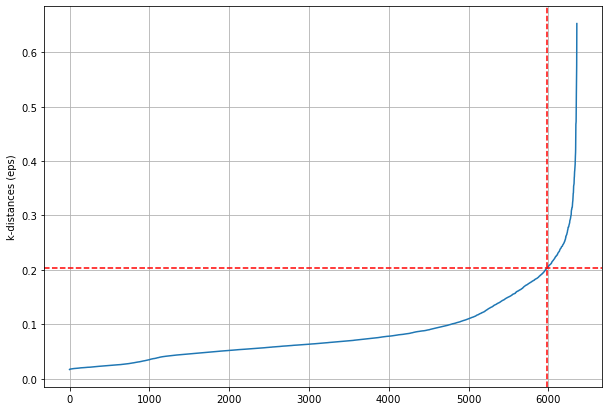

Estimated number of clusters: 2
Estimated number of noise points: 81
Silhouette Coefficient: 0.830


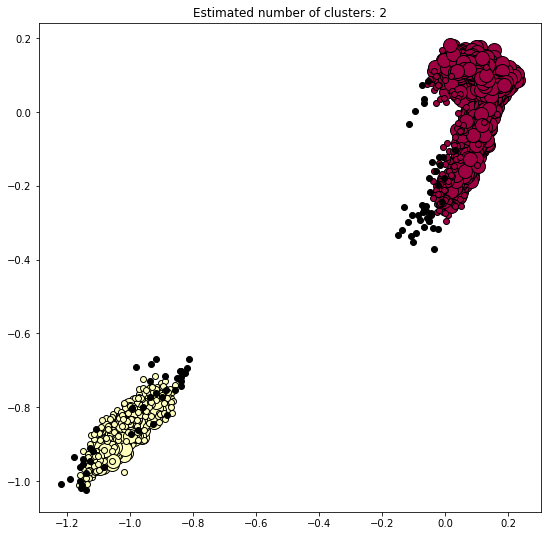

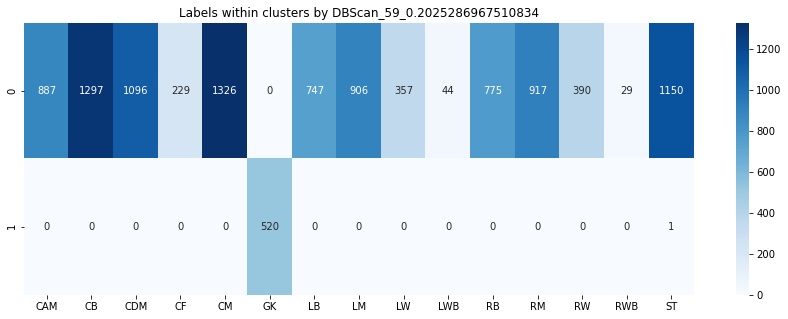

Using minpts - 60
start = 100, end = -300
eps_idx = 5999, eps = 0.2060030142115854


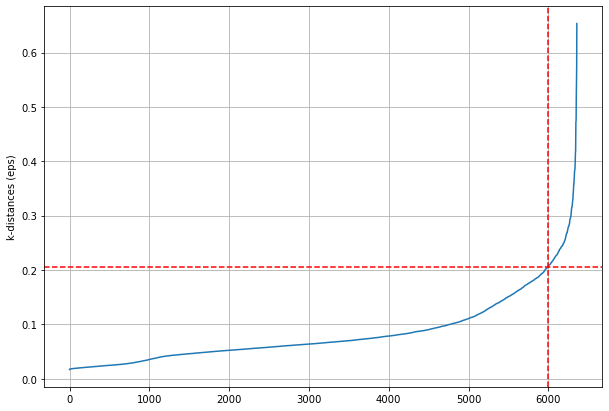

Estimated number of clusters: 2
Estimated number of noise points: 77
Silhouette Coefficient: 0.831


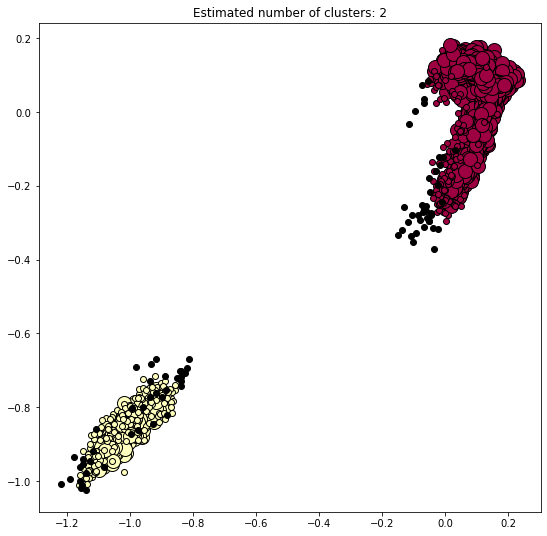

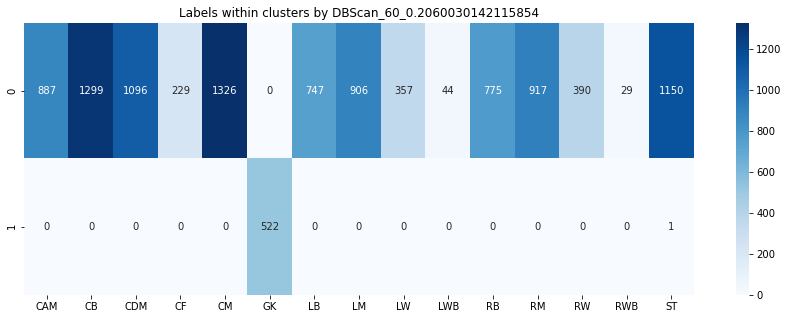

Using minpts - 61
start = 100, end = -300
eps_idx = 6036, eps = 0.21398083153778868


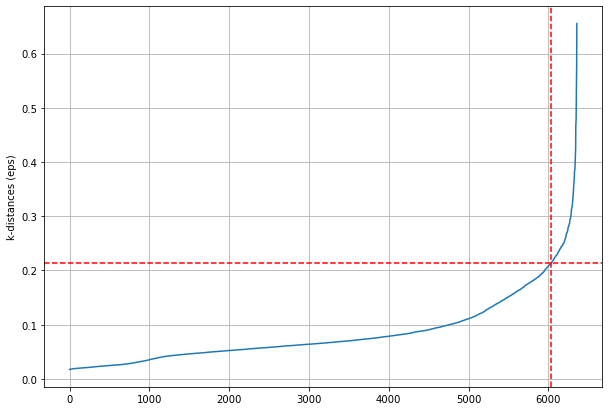

Estimated number of clusters: 2
Estimated number of noise points: 56
Silhouette Coefficient: 0.826


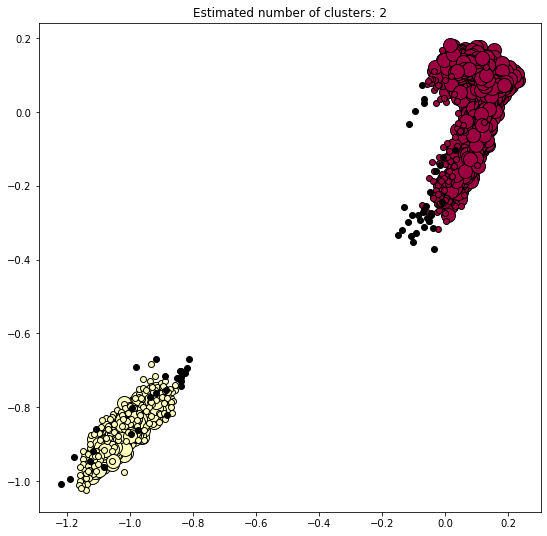

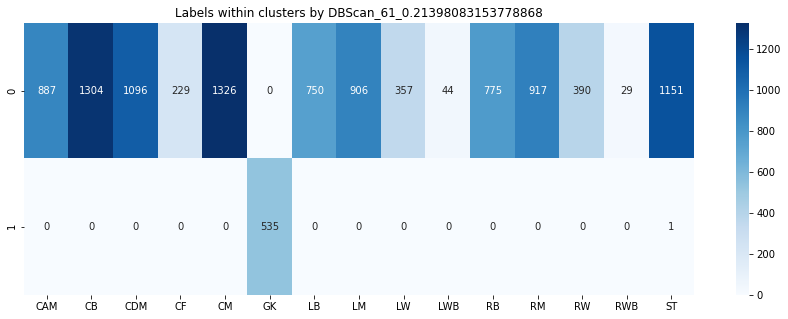

Using minpts - 62
start = 100, end = -300
eps_idx = 6046, eps = 0.21684461287217666


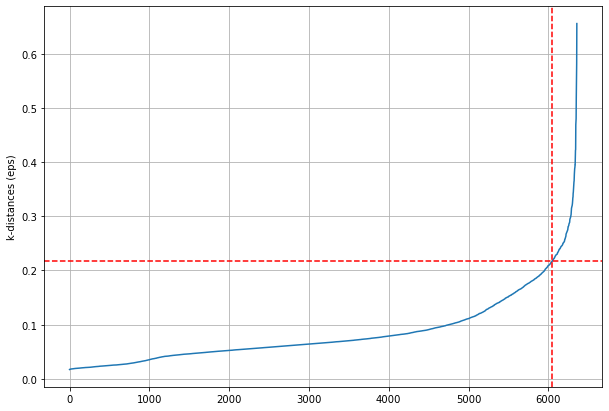

Estimated number of clusters: 2
Estimated number of noise points: 55
Silhouette Coefficient: 0.824


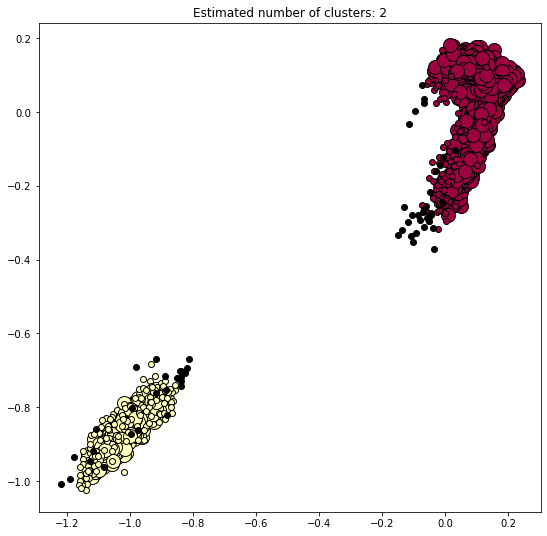

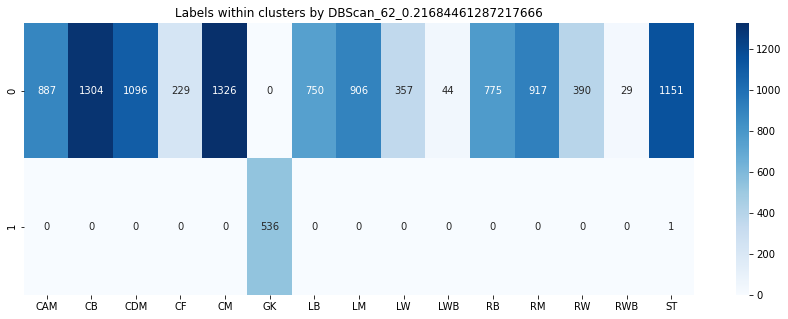

Using minpts - 63
start = 100, end = -300
eps_idx = 5978, eps = 0.2058095333808301


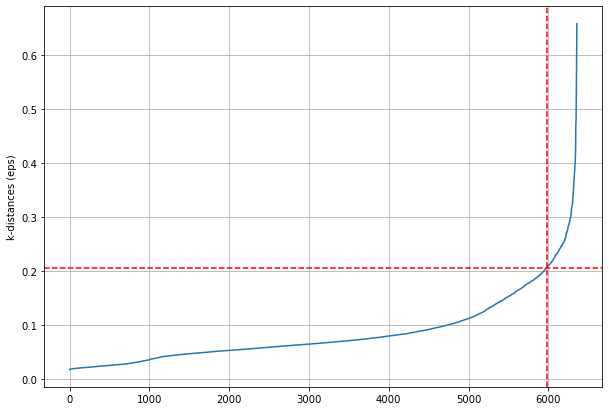

Estimated number of clusters: 2
Estimated number of noise points: 83
Silhouette Coefficient: 0.829


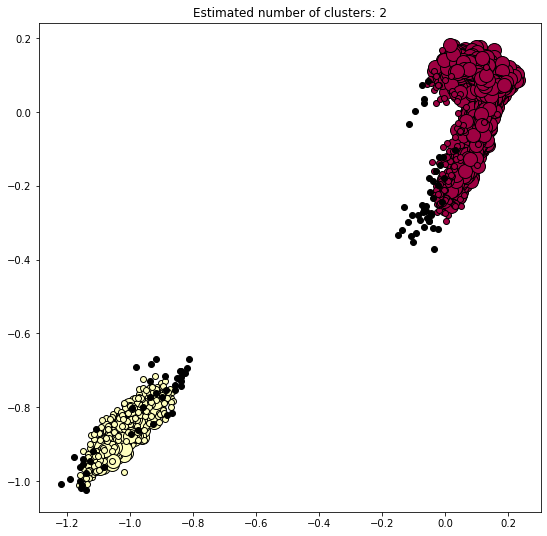

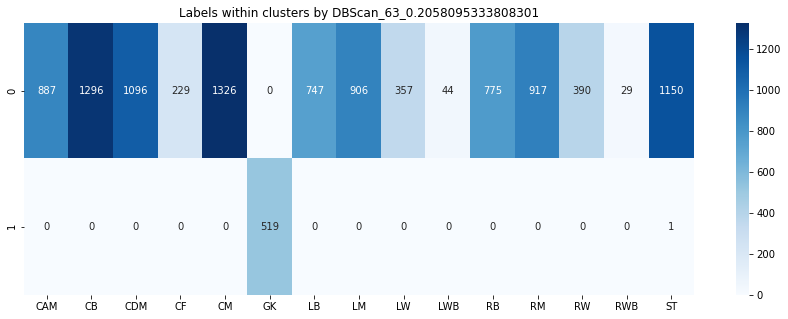

Using minpts - 64
start = 100, end = -300
eps_idx = 5910, eps = 0.1950622881711004


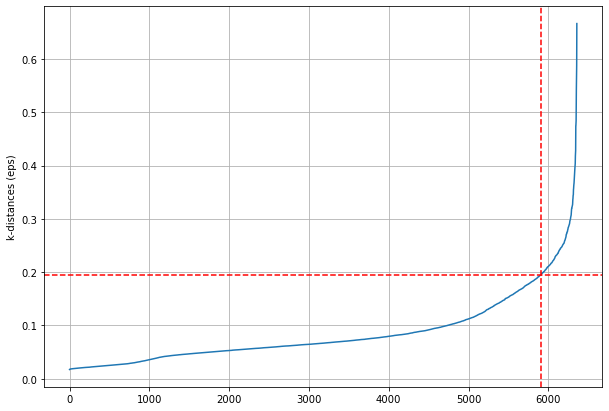

Estimated number of clusters: 2
Estimated number of noise points: 102
Silhouette Coefficient: 0.827


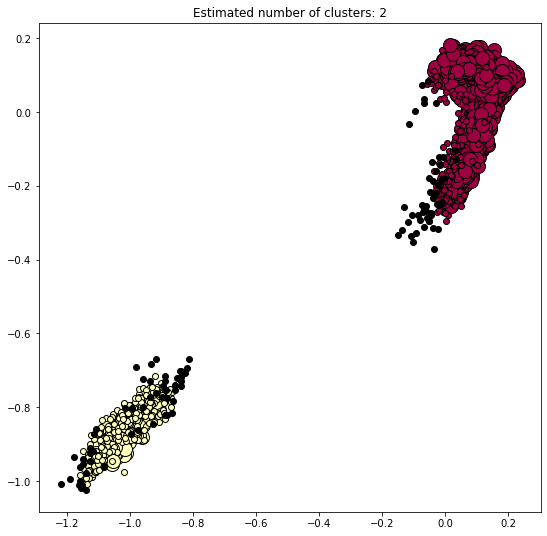

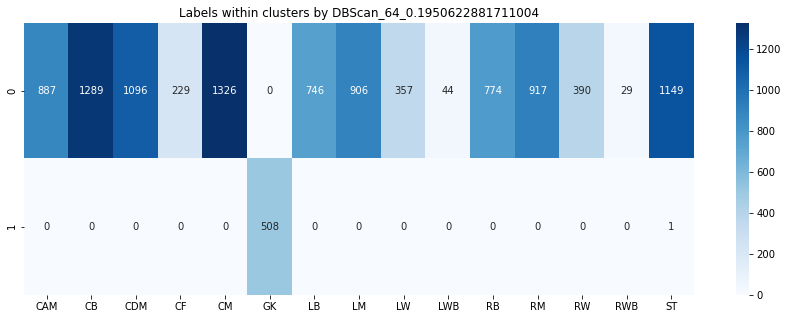

Using minpts - 65
start = 100, end = -300
eps_idx = 5971, eps = 0.20539712399871646


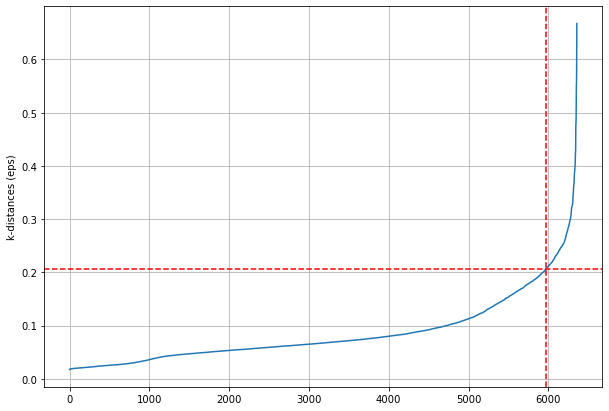

Estimated number of clusters: 2
Estimated number of noise points: 86
Silhouette Coefficient: 0.827


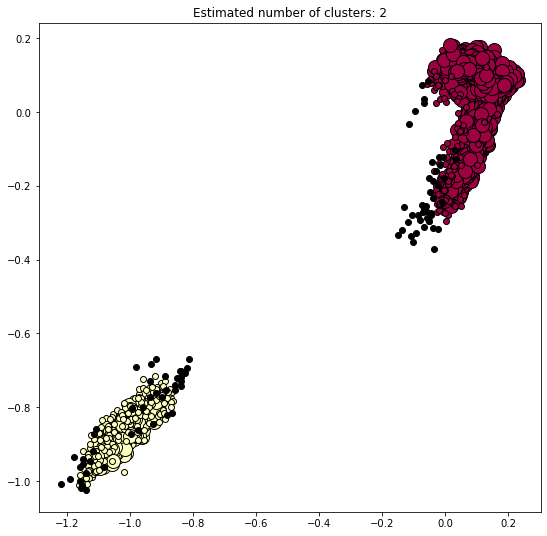

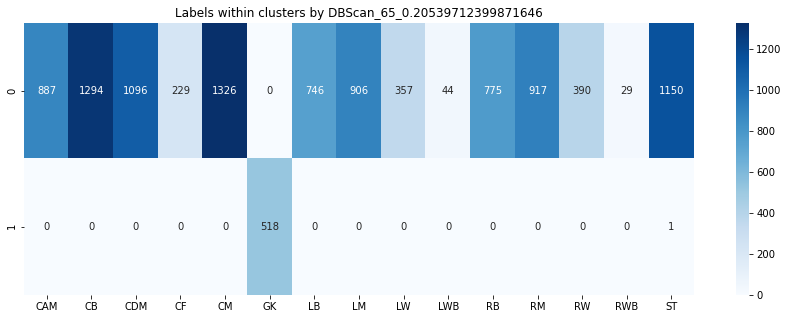

Using minpts - 66
start = 100, end = -300
eps_idx = 5904, eps = 0.1967910851405122


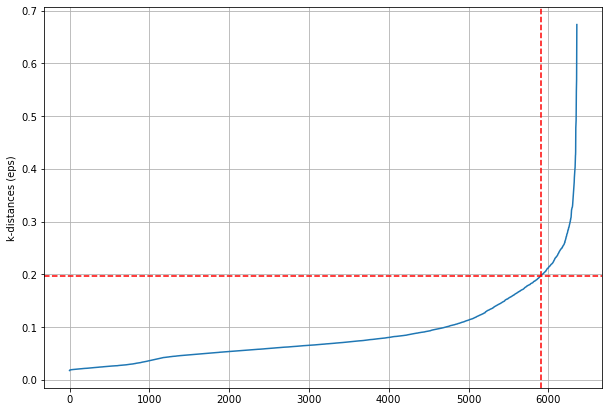

Estimated number of clusters: 2
Estimated number of noise points: 103
Silhouette Coefficient: 0.826


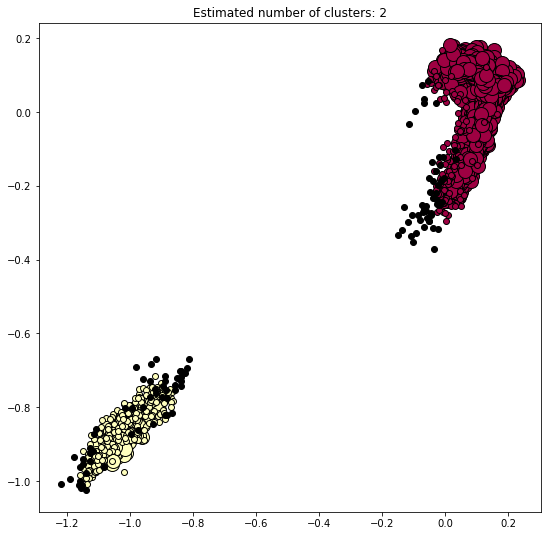

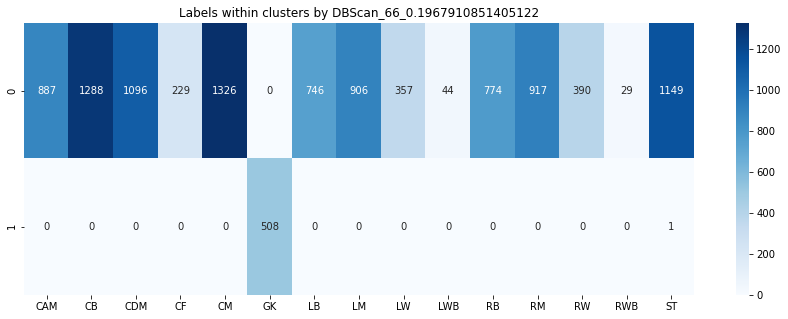

Using minpts - 67
start = 100, end = -300
eps_idx = 5903, eps = 0.19708124003236985


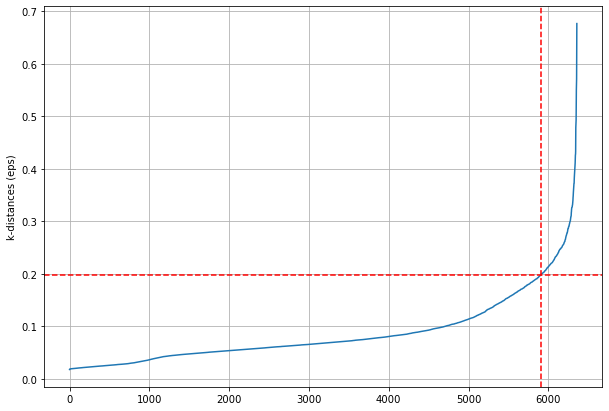

Estimated number of clusters: 2
Estimated number of noise points: 105
Silhouette Coefficient: 0.824


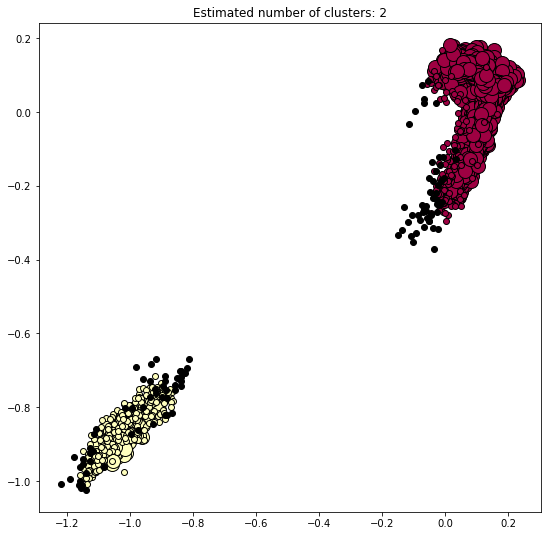

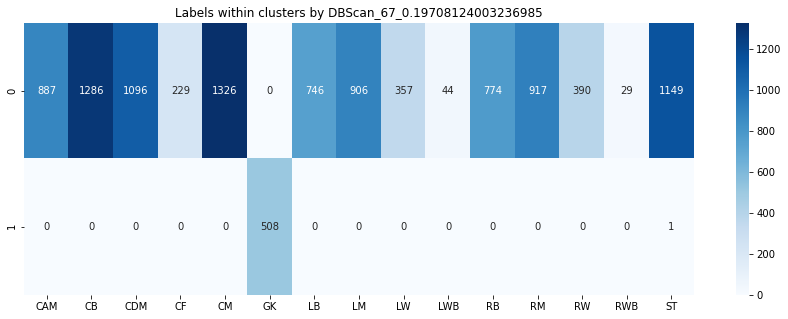

Using minpts - 68
start = 100, end = -300
eps_idx = 5709, eps = 0.17608103589552712


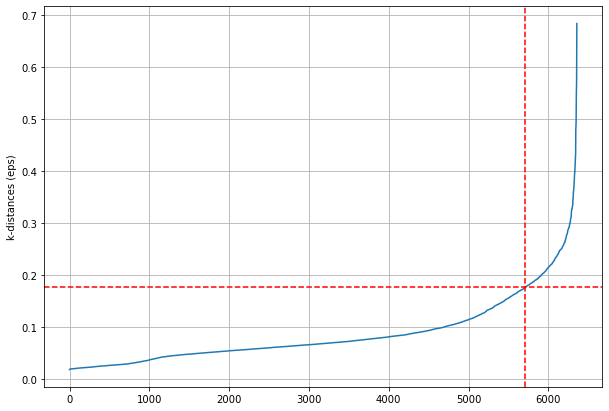

Estimated number of clusters: 2
Estimated number of noise points: 252
Silhouette Coefficient: 0.812


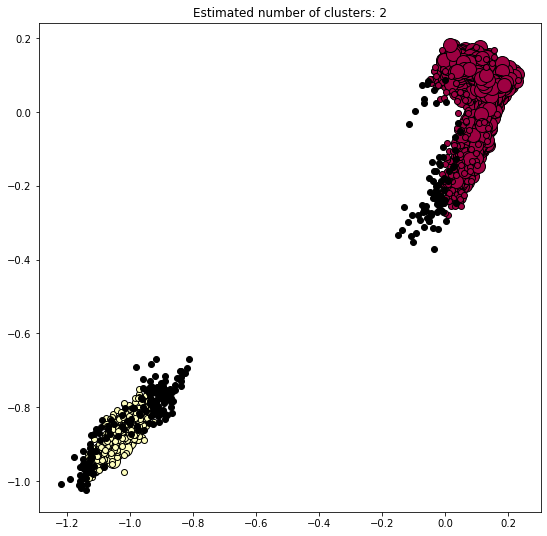

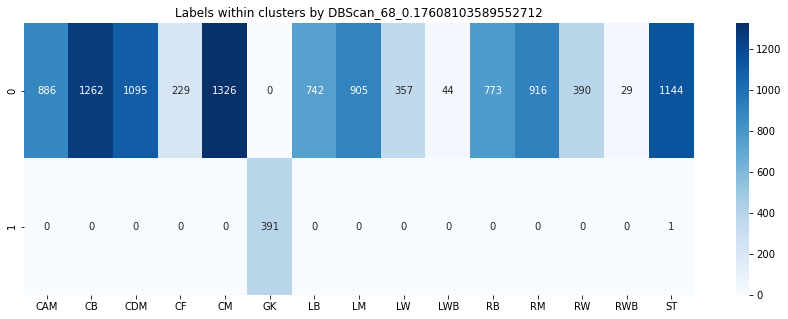

Using minpts - 69
start = 100, end = -300
eps_idx = 6009, eps = 0.2165047948194297


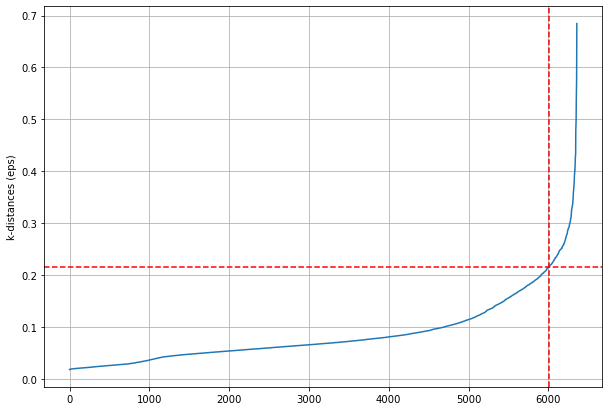

Estimated number of clusters: 2
Estimated number of noise points: 66
Silhouette Coefficient: 0.826


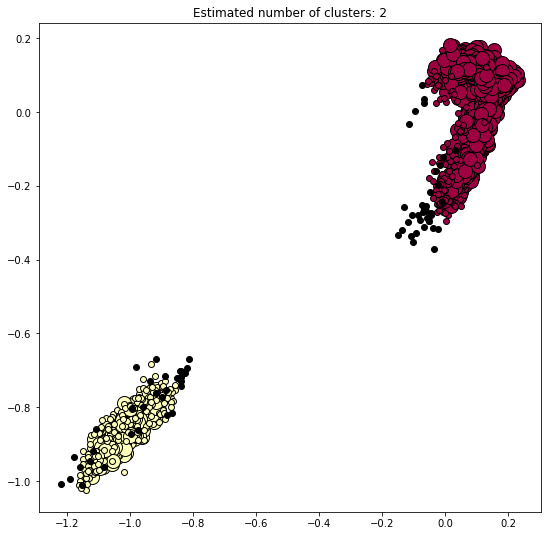

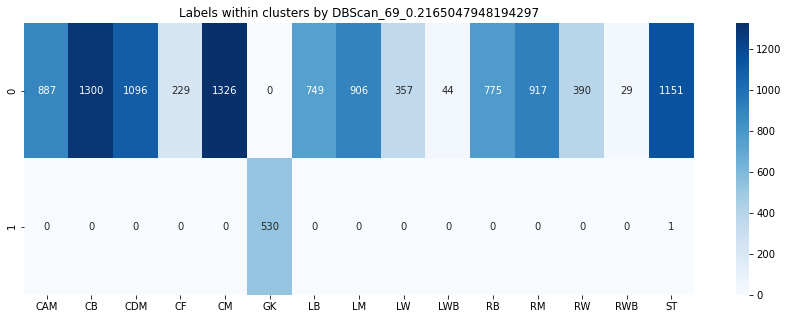

In [30]:
# Do DBScan
for mp in MIN_PTS:
    print('Using minpts - {}'.format(mp))
    dist = kth_neighbour(mp)
    idx, eps = find_eps(dist)
    plot_kdist(dist, idx)
    try_dbscan(X, eps, mp)

In [31]:
# LDA Embeddings: 
# 1. soccer_player_embeddings_feature_no_labels_LDA.csv
df = all_dfs[2]
df.head(2)

,Unnamed: 0,LDA_PC1,LDA_PC2,LDA_PC3,LDA_PC4,LDA_PC5,LDA_PC6,LDA_PC7,LDA_PC8,LDA_PC9,...,LDA_PC36,LDA_PC37,LDA_PC38,LDA_PC39,LDA_PC40,LDA_PC41,LDA_PC42,player_fifa_api_id,player_positions,player_positions_general
0,0,-2.719920,-3.231187,-2.064467,-0.070135,-2.153782,-0.467022,-1.415772,-1.066637,-0.392626,...,-0.032899,0.023300,-0.607117,1.884155,0.418476,0.100440,-0.682479,218353,CB,DEF
1,1,-2.836651,-2.672179,2.376146,3.147144,-0.044590,1.308416,-0.822004,0.446822,-0.281568,...,0.861496,-0.214361,0.721046,0.127230,0.847701,-0.241239,0.023072,189615,LB,DEF


In [32]:
y = df['player_positions']
X = df.drop(columns=['Unnamed: 0', 'player_positions', 'player_fifa_api_id','player_positions_general'])

labels = []
for l in y.values:
    if ',' in l:
        labels.extend(l.split(", "))
    else:
        labels.append(l)

labels, counts = np.unique(labels, return_counts=True)

n_features = len(X.columns)
MIN_PTS = [i for i in range((n_features*2)-5, (n_features*2)+6)]

Using minpts - 79
start = 100, end = -300
eps_idx = 6023, eps = 9.036600560003032


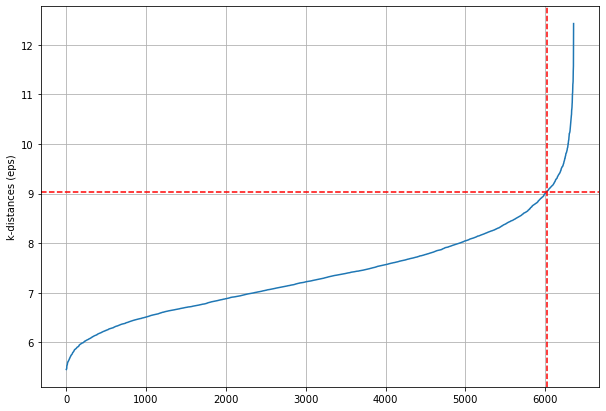

Estimated number of clusters: 2
Estimated number of noise points: 20
Silhouette Coefficient: 0.307


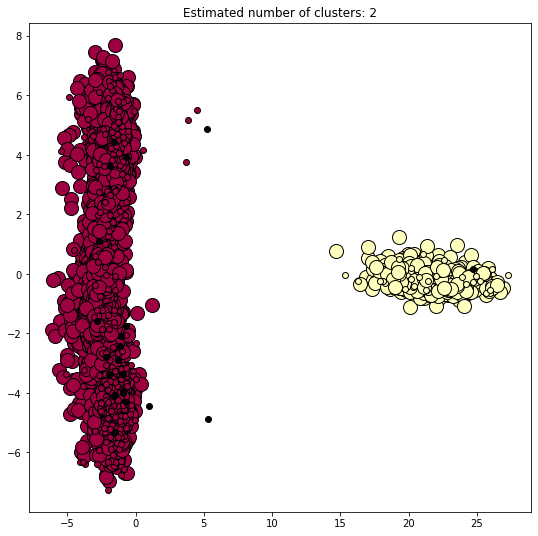

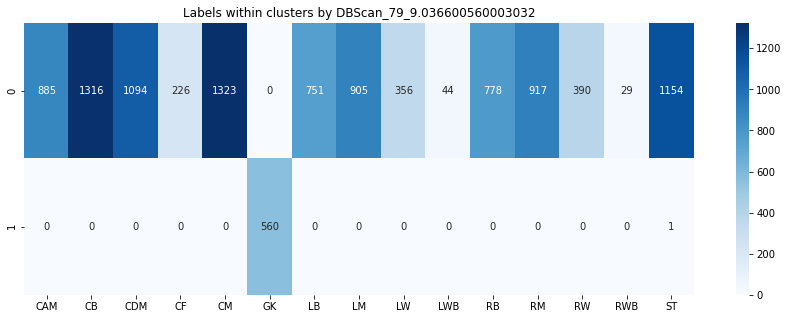

Using minpts - 80
start = 100, end = -300
eps_idx = 155, eps = 5.924974027519012


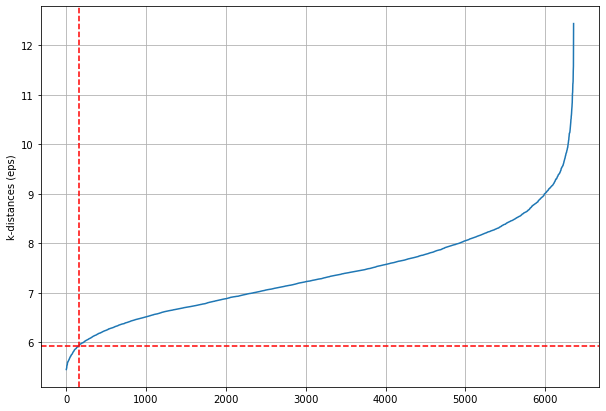

Estimated number of clusters: 2
Estimated number of noise points: 4218
Silhouette Coefficient: -0.060


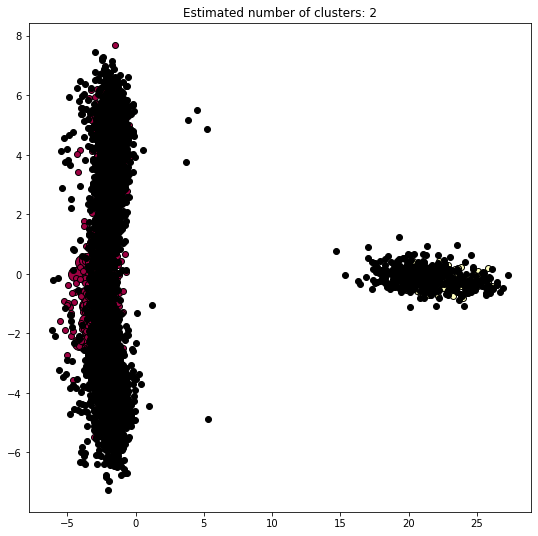

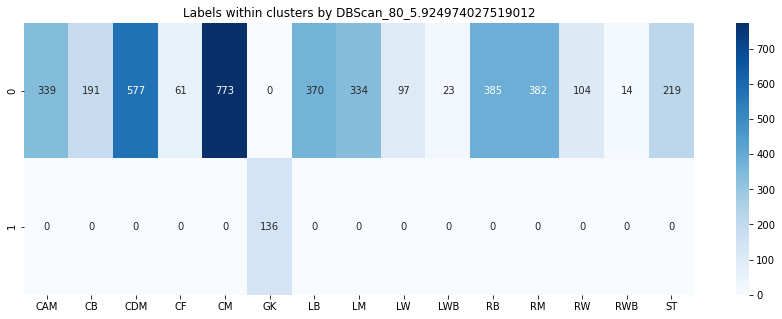

Using minpts - 81
start = 100, end = -300
eps_idx = 5986, eps = 8.976313125634597


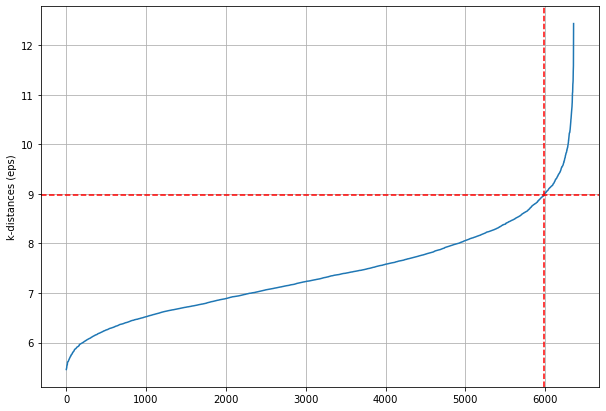

Estimated number of clusters: 2
Estimated number of noise points: 21
Silhouette Coefficient: 0.304


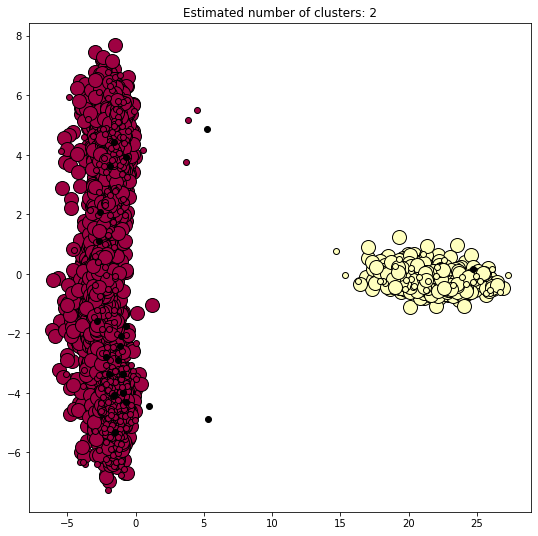

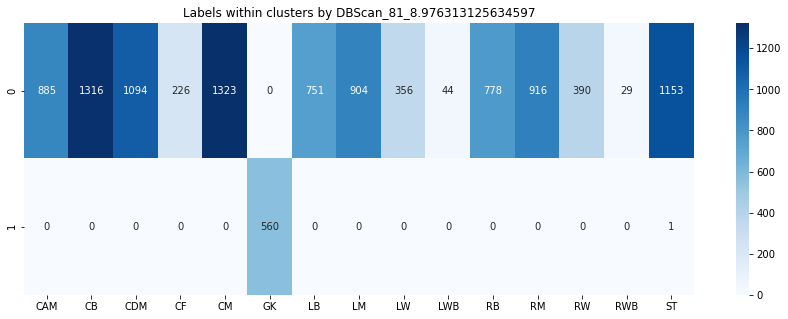

Using minpts - 82
start = 100, end = -300
eps_idx = 5984, eps = 8.988949571470606


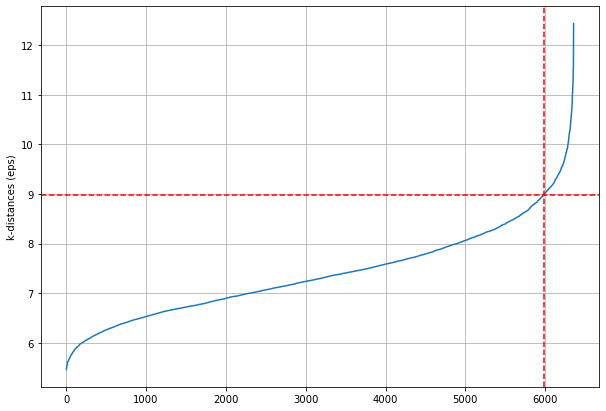

Estimated number of clusters: 2
Estimated number of noise points: 21
Silhouette Coefficient: 0.304


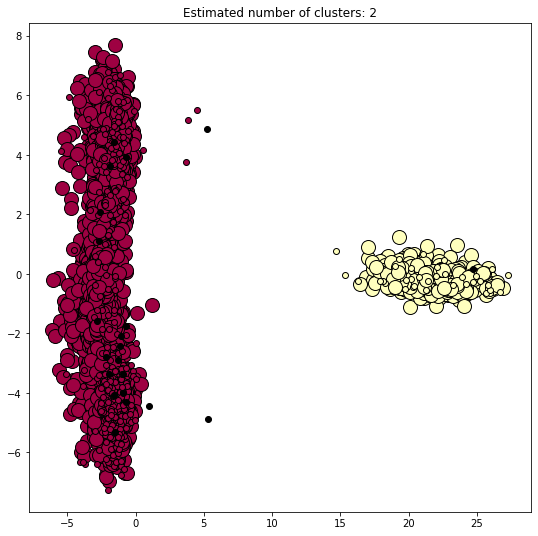

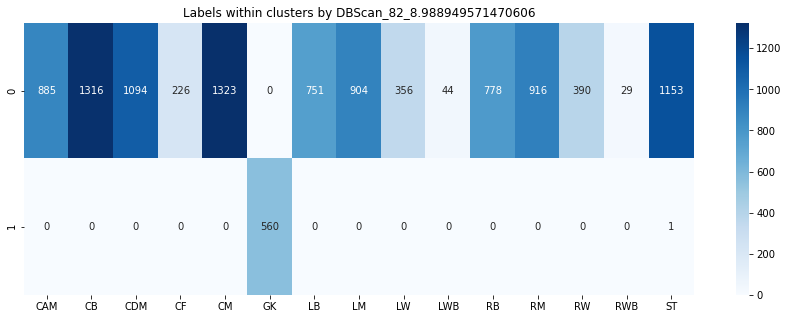

Using minpts - 83
start = 100, end = -300
eps_idx = 5901, eps = 8.847052103724707


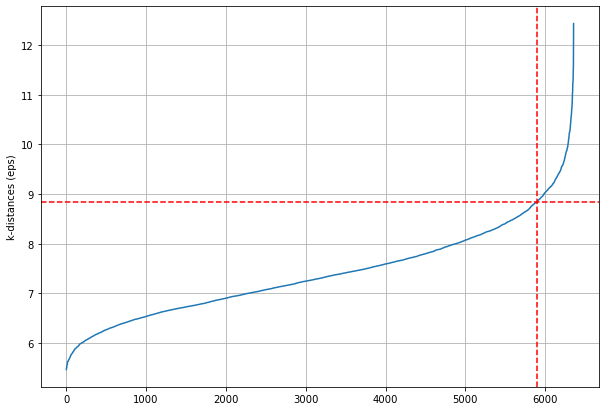

Estimated number of clusters: 2
Estimated number of noise points: 28
Silhouette Coefficient: 0.310


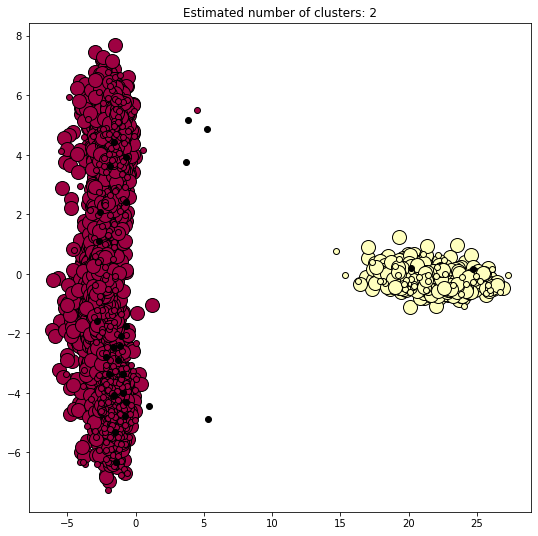

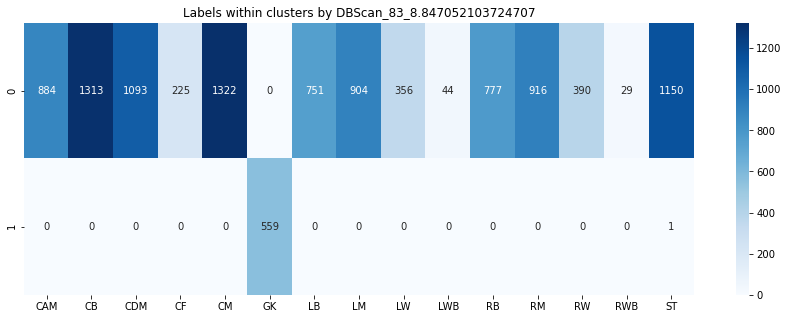

Using minpts - 84
start = 100, end = -300
eps_idx = 159, eps = 5.957921590707322


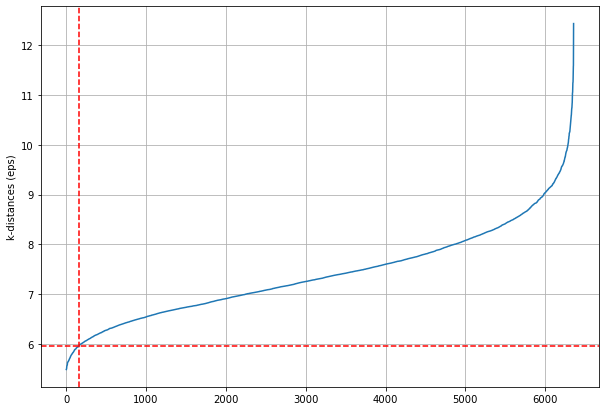

Estimated number of clusters: 2
Estimated number of noise points: 4145
Silhouette Coefficient: -0.053


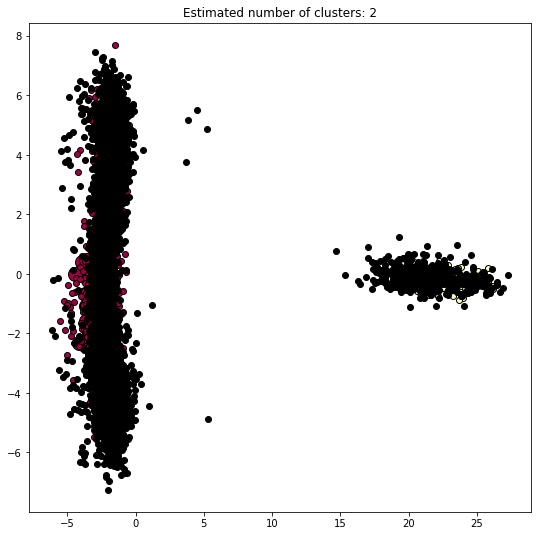

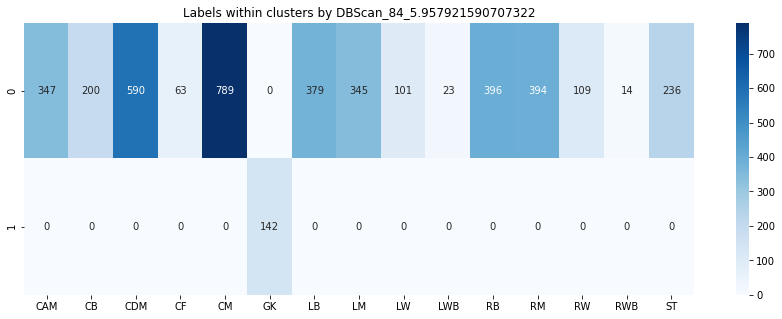

Using minpts - 85
start = 100, end = -300
eps_idx = 5982, eps = 9.002325436064227


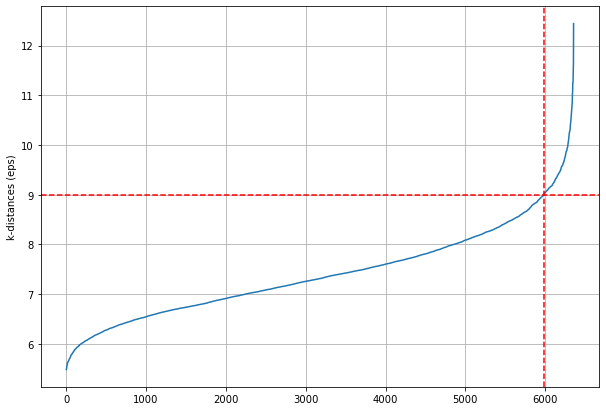

Estimated number of clusters: 2
Estimated number of noise points: 21
Silhouette Coefficient: 0.304


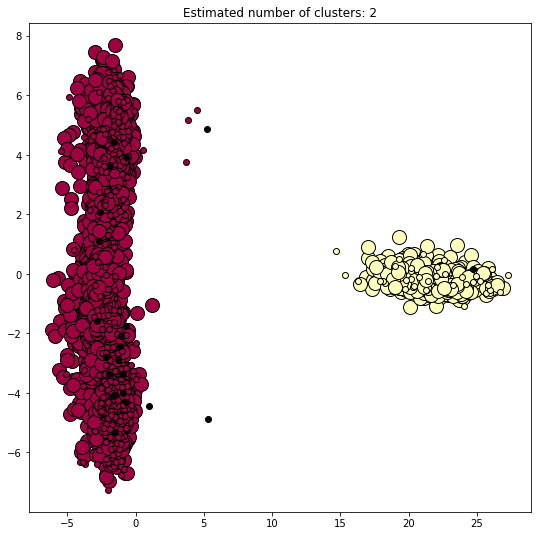

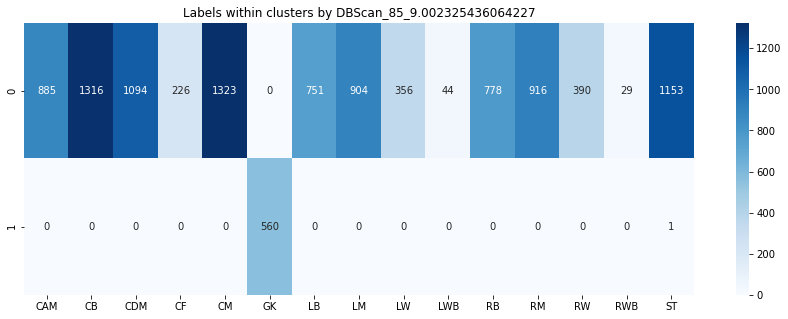

Using minpts - 86
start = 100, end = -300
eps_idx = 5772, eps = 8.675897769644155


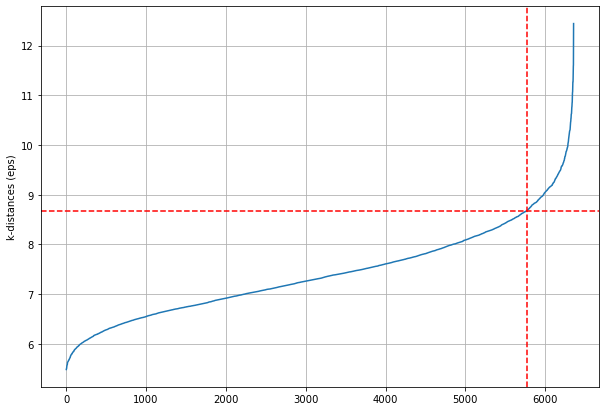

Estimated number of clusters: 2
Estimated number of noise points: 35
Silhouette Coefficient: 0.297


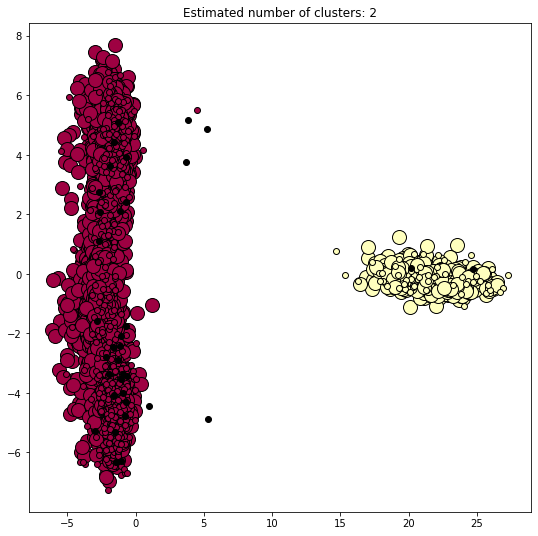

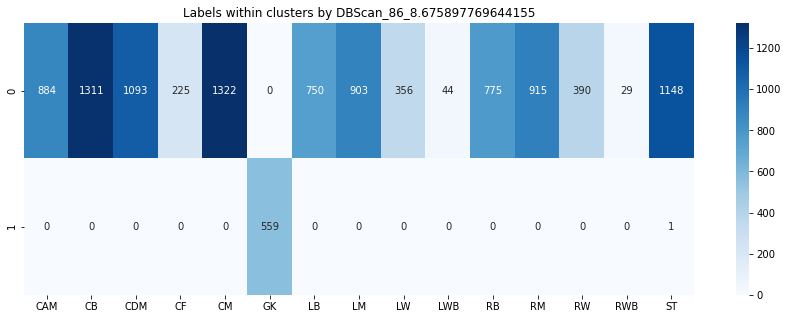

Using minpts - 87
start = 100, end = -300
eps_idx = 5983, eps = 9.012259892974471


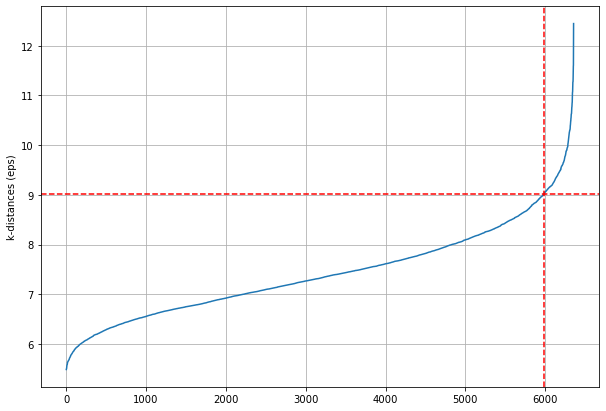

Estimated number of clusters: 2
Estimated number of noise points: 21
Silhouette Coefficient: 0.304


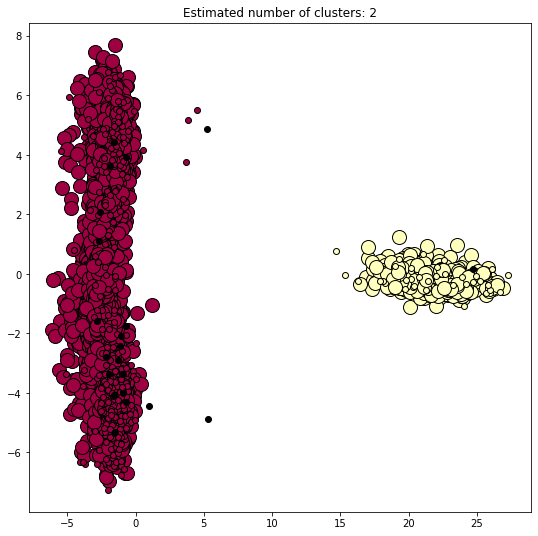

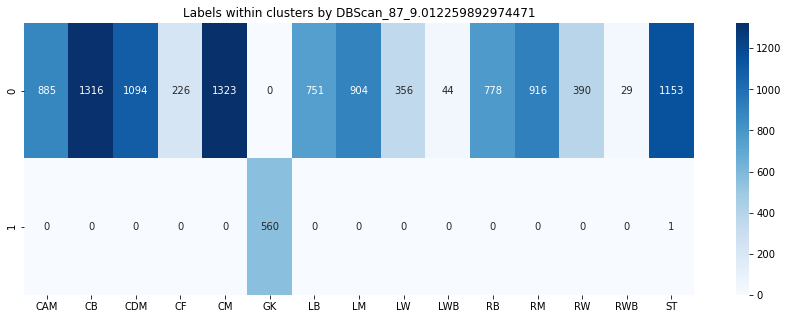

Using minpts - 88
start = 100, end = -300
eps_idx = 5830, eps = 8.782167629018621


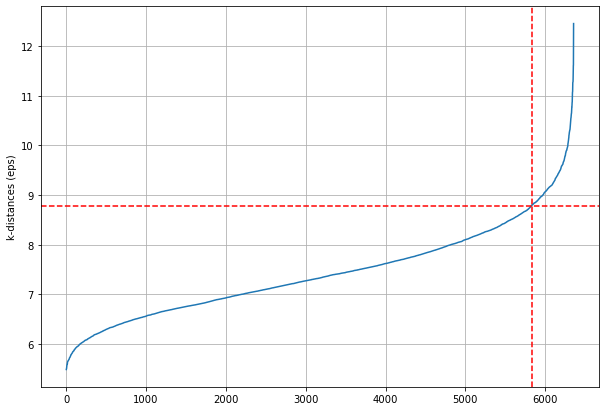

Estimated number of clusters: 2
Estimated number of noise points: 34
Silhouette Coefficient: 0.298


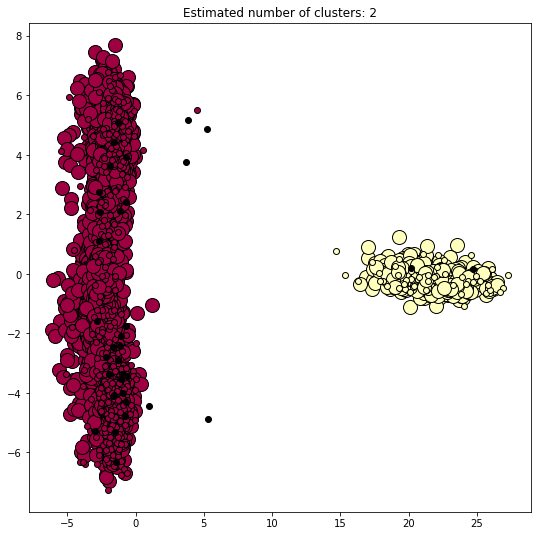

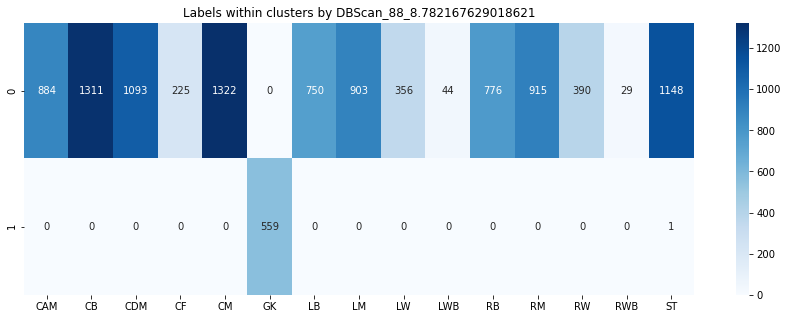

Using minpts - 89
start = 100, end = -300
eps_idx = 5814, eps = 8.761896689514163


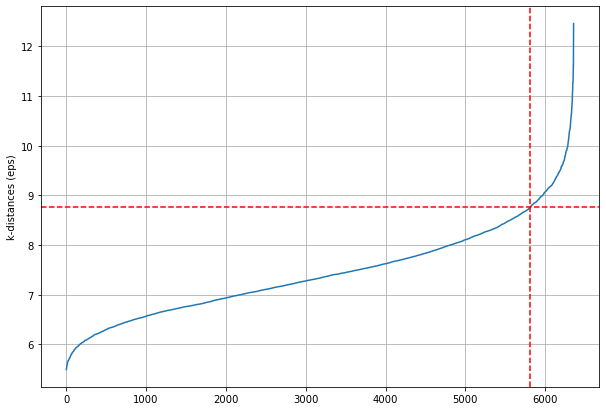

Estimated number of clusters: 2
Estimated number of noise points: 34
Silhouette Coefficient: 0.298


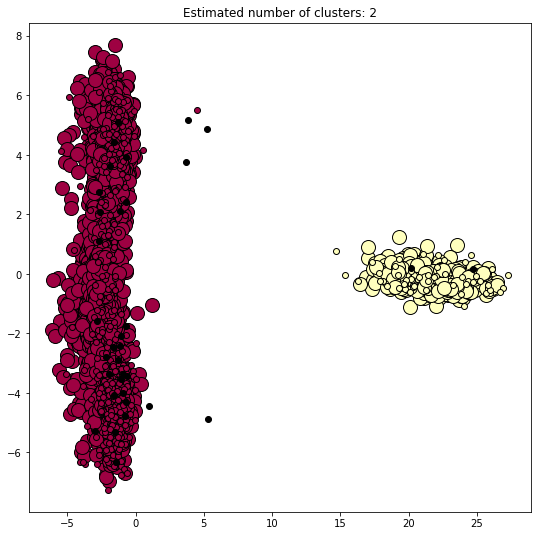

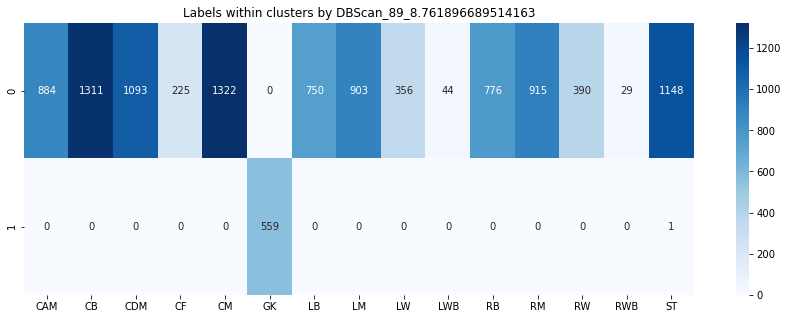

In [38]:
# Do DBScan

for mp in MIN_PTS:
    print('Using minpts - {}'.format(mp))
    dist = kth_neighbour(mp)
    idx, eps = find_eps(dist)
    plot_kdist(dist, idx)
    db_labels, n_clusters = try_dbscan(X, eps, mp)